In [1]:
from functions import *
from VAE import VariationalAutoEncoder as VAE
from sklearn.decomposition import PCA
from MLP import MLP
from OODBoost import OODModel
from metrics import extended_confusion_matrix, ClassificationComparison

from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sbo import soft_brownian_offset

import pandas as pd
import numpy as np
import seaborn as sn
import random
import matplotlib.pyplot as plt

import torch
from torch import Tensor, tensor
from torch.nn.functional import mse_loss
from torch.utils.data import DataLoader, TensorDataset
from ood_score import get_ood_score, get_ood_score_boost, highlight_ood_metrics
from detection_methods_posthoc import detection_method

import os

In [2]:
def set_random_seed(seed=0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)  # Set seed for CPU
    torch.cuda.manual_seed(seed)  # Set seed for GPU (if using CUDA)
    torch.cuda.manual_seed_all(seed)  # Set seed for all GPUs
    np.random.seed(seed)  # Set seed for NumPy
    random.seed(seed)  # Set seed for Python random
    torch.backends.cudnn.deterministic = True  # Ensure deterministic behavior
    torch.backends.cudnn.benchmark = False  # Disable benchmark for reproducibility

# Shear Wall Database

In [3]:
file_path = r'C:\Users\E2-415\Desktop\Databases\Shear_Wall_Database.xlsx'
problem_name = "_SW"
df1 = pd.read_excel(file_path, sheet_name='Database')
df=df1.loc[:, 'FailureMode':'Ab/Ag']
df.head()

,FailureMode,M/Vlw,lw/tw,"ρvwFy,vw/fc","ρhwFy,vw/fc","ρvcFy,vc/fc","ρhcFy,hc/fc",P/fcAg,Section,Ab/Ag
0,1,1.1,10.714286,0.268879,0.136711,0.348231,0.149140,0.000000,R,0.0
1,1,1.1,10.714286,0.262358,0.133396,0.339785,0.145522,0.102168,R,0.0
2,1,1.1,10.714286,0.346364,0.176108,0.448584,0.192118,0.208187,R,0.0
3,1,1.1,10.714286,0.334023,0.169834,0.432601,0.185273,0.000000,R,0.0
4,1,1.1,10.714286,0.324766,0.165127,0.420612,0.180139,0.101727,R,0.0


In [4]:
print_ranges(df)

                  Min       Max
FailureMode         1         4
M/Vlw        0.249869       4.1
lw/tw        4.347826      57.0
ρvwFy,vw/fc       0.0  0.487957
ρhwFy,vw/fc       0.0  0.326964
ρvcFy,vc/fc       0.0  2.645968
ρhcFy,hc/fc       0.0  1.264049
P/fcAg            0.0  0.499402
Section             B         R
Ab/Ag             0.0  0.443262


In [5]:
X=df.loc[:, df.columns != 'FailureMode']
y=df['FailureMode']

In [6]:
processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'standard')

print("Processed DataFrame:")
print(processed_df)

print("\nLength of Numerical Columns:")
print(len_numerical)

print("\nLength of Categorical Columns:")
print(len_ohes)

Processed DataFrame:
        M/Vlw     lw/tw  ρvwFy,vw/fc  ρhwFy,vw/fc  ρvcFy,vc/fc  ρhcFy,hc/fc  \
0   -0.406530 -0.457868     2.545909     0.951503    -0.094746     0.101831   
1   -0.406530 -0.457868     2.456613     0.896205    -0.117372     0.084545   
2   -0.406530 -0.457868     3.606911     1.608546     0.174084     0.307222   
3   -0.406530 -0.457868     3.437929     1.503901     0.131268     0.274510   
4   -0.406530 -0.457868     3.311173     1.425405     0.099151     0.249972   
..        ...       ...          ...          ...          ...          ...   
388  0.860108 -0.616925    -0.376663    -0.968029    -0.904861    -0.507603   
389  0.860108 -0.616925    -0.389625    -0.975157    -0.907288    -0.509646   
390  0.860108 -0.616925    -0.425691    -0.993155    -0.913417    -0.514803   
391 -0.547268 -0.156209    -0.368910    -0.909143    -0.505031    -0.260701   
392 -0.547268 -0.156209    -0.404908    -0.928826    -0.529559    -0.358941   

       P/fcAg     Ab/Ag  Secti

## Comparison of Data Generation

### VAE

In [7]:
%%time
set_random_seed(0)

x_train = tensor(processed_df.values, dtype=torch.float32)

layers_dim = [128, 64, 32, 3]  # Encoder and Decoder layer sizes
batch_size = 32
epochs = 500
iter_vae = epochs # if = epoch return to vae
learning_rate = 5e-3
num_var = len_numerical + sum(len_ohes)

vae = VAE(len_numerical, len_ohes, layers_dim=layers_dim, batch_norm=True, activation='relu', dropout_rate=0.0)

vae.train_model(x_train, lr_e=learning_rate, lr_d=learning_rate, batch_size=batch_size, n_iter=epochs, iter_vae=iter_vae, 
                    beta_kl=0.5, beta_rec=1.0)

100%|██████████| 500/500 [00:26<00:00, 18.78it/s]

CPU times: total: 3min 7s
Wall time: 27.3 s


In [8]:
vae.eval()
with torch.no_grad():
    mu, _, _, recon_data = vae(x_train)

In [9]:
mse_loss(recon_data, x_train)

tensor(0.1365)

In [10]:
# plot_embed(mu, point_size=3, filename="vae_lv.jpeg")

#### Sample Generation

In [11]:
z_sample = torch.randn(size=(x_train.shape[0], layers_dim[-1]))
synth_data = vae.sample(z_sample)

In [12]:
recon_df = reverse_process_dataframe(synth_data, len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols']
recon_df[cols] = recon_df[cols].clip(lower=0)

In [13]:
rename_dict = {
    'M/Vlw': r'$M/Vl_{w}$',
    'lw/tw': r'$l_{w}/t_{w}$',
    'ρvwFy,vw/fc': r'$\rho_{vw}F_{y,vw}/f_{c}^\prime$',
    'ρhwFy,vw/fc': r'$\rho_{hw}F_{y,vw}/f_{c}^\prime$',
    'ρvcFy,vc/fc': r'$\rho_{vc}F_{y,vc}/f_{c}^\prime$',
    'ρhcFy,hc/fc': r'$\rho_{hc}F_{y,hc}/f_{c}^\prime$',
    'P/fcAg': r'$P/f_{c}^\prime A_{g}$',
    'Section': 'Section Shape',
    'Section_B': 'Barbell',
    'Section_R': 'Rectangular',
    'Section_F': 'Flanged',
    'Ab/Ag': r'$A_{b}/A_{g}$',
    'R': 'Rectangular',
    'F': 'Flanged',
    'B': 'Barbell'
}

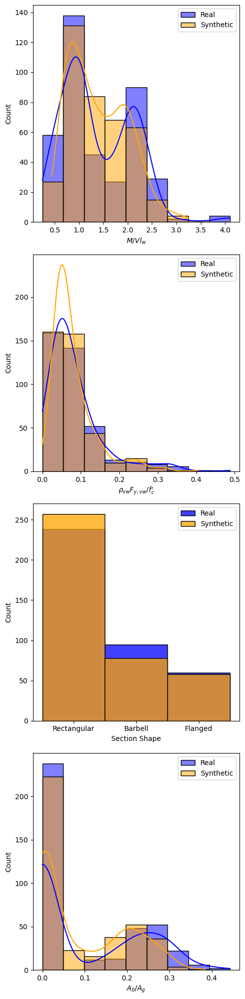

In [14]:
distribution_comparison(X, recon_df, stacked=True, columns=['M/Vlw','ρvwFy,vw/fc','Section','Ab/Ag'], rename_dict=rename_dict)#, filename='vae_distribution_comparison.jpeg')

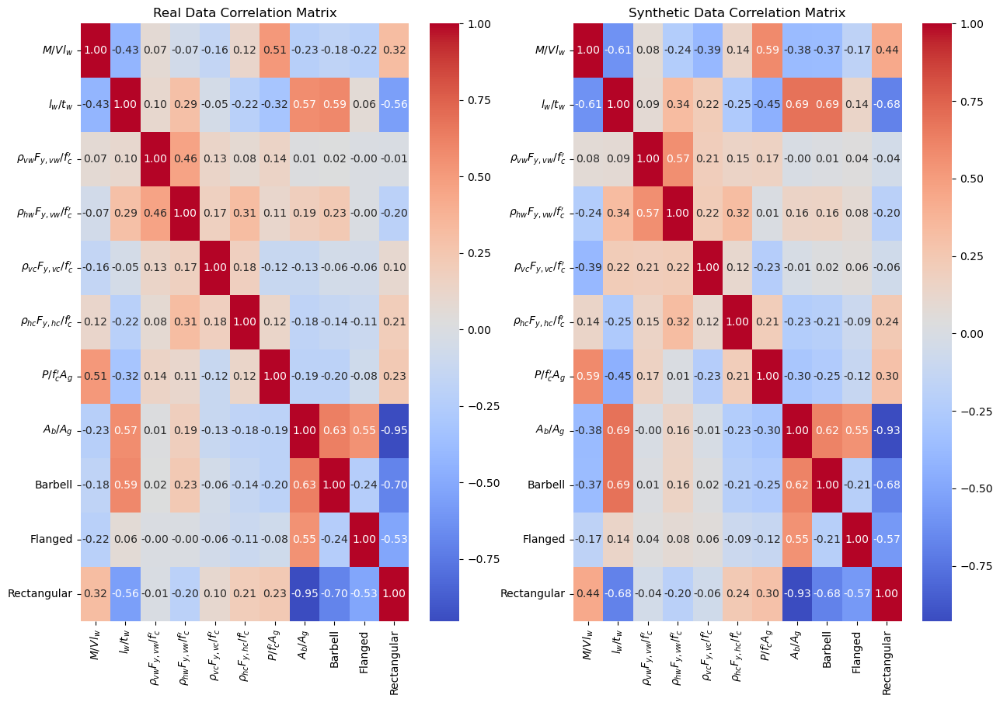

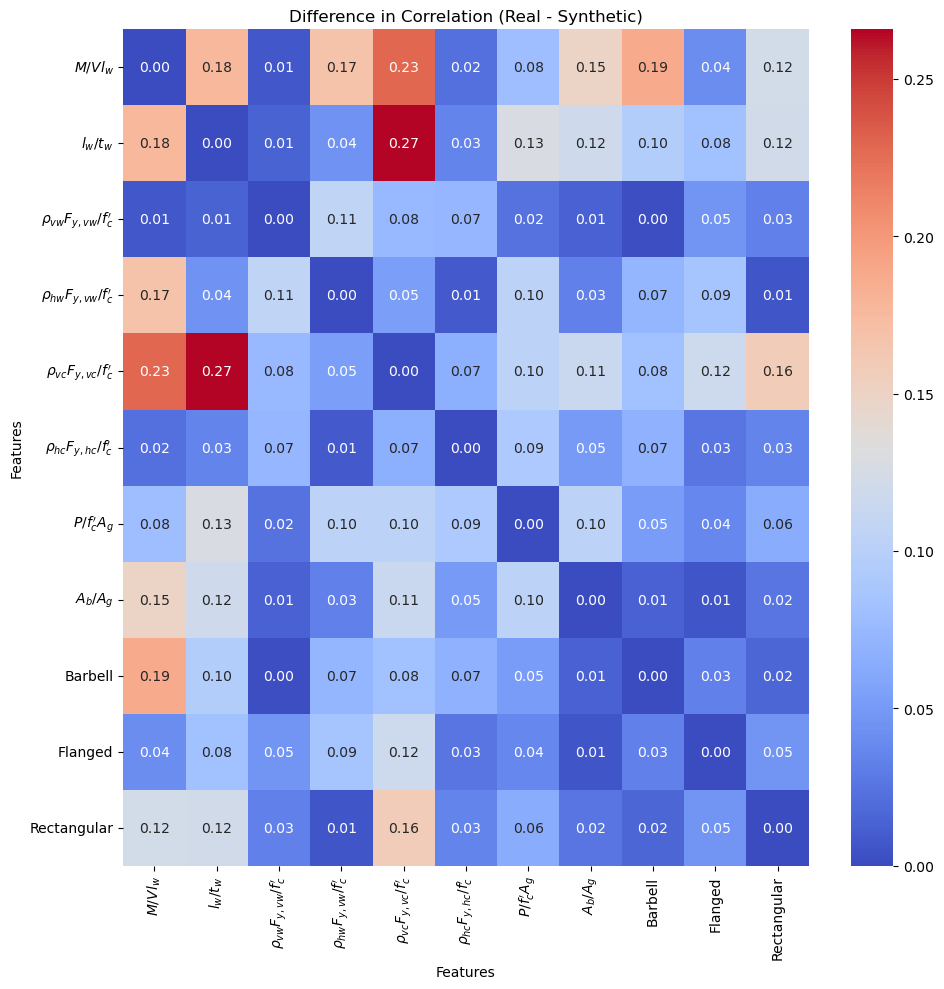

In [15]:
corrmap_comparison(X, recon_df, rename_dict=rename_dict)#, filename_prefix='vae')

#### OOD Generation

In [16]:
latent_var = mu.numpy()

# hard brownian offset guarantee samples at leat d_min distance away from rest of sample
ood = soft_brownian_offset(latent_var, d_min=1.5, d_off=0.2, softness=0, n_samples = len(x_train))

x_ood = np.concatenate((latent_var,ood), axis = 0)
y_ood = ['ID']*len(y) +['OOD'] *len(x_train)
plot_embed(x_ood,y_ood)

In [17]:
synth_data = vae.sample(tensor(ood, dtype=torch.float32))

recon_df = reverse_process_dataframe(synth_data, len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols']
recon_df[cols] = recon_df[cols].clip(lower=0)

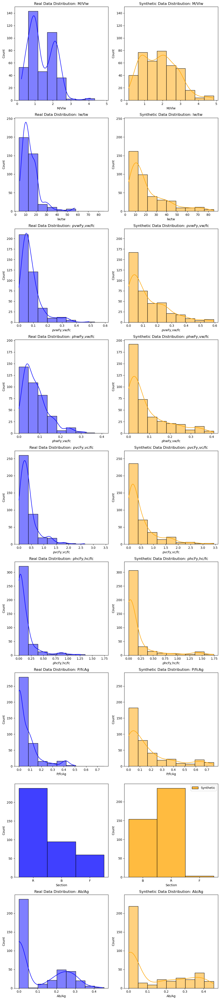

In [18]:
distribution_comparison(X, recon_df, stacked=False)

### PCA

In [19]:
%%time
set_random_seed(0)
n_latent = layers_dim[-1]
pca = PCA(n_components=n_latent)
latent_var = pca.fit_transform(processed_df.values)
rec_X = pca.inverse_transform(latent_var)

CPU times: total: 0 ns
Wall time: 6 ms


In [20]:
# plot_embed(mu, point_size=3, filename="pca_lv.jpeg")

In [21]:
mse_loss(tensor(rec_X), x_train)

tensor(0.2730, dtype=torch.float64)

In [22]:
lv_sample=np.random.normal(loc=0, scale=1, size=(x_train.shape[0], layers_dim[-1]))
synth_data = pca.inverse_transform(lv_sample)

In [23]:
recon_df = reverse_process_dataframe(tensor(synth_data), len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols']
recon_df[cols] = recon_df[cols].clip(lower=0)

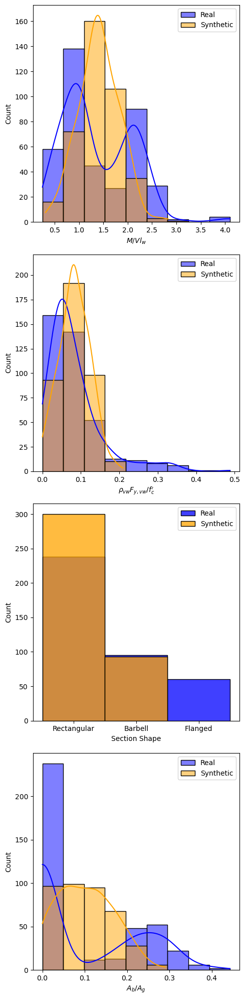

In [24]:
distribution_comparison(X, recon_df, stacked=True, columns=['M/Vlw','ρvwFy,vw/fc','Section','Ab/Ag'], rename_dict=rename_dict)#, filename='pca_distribution_comparison.jpeg')

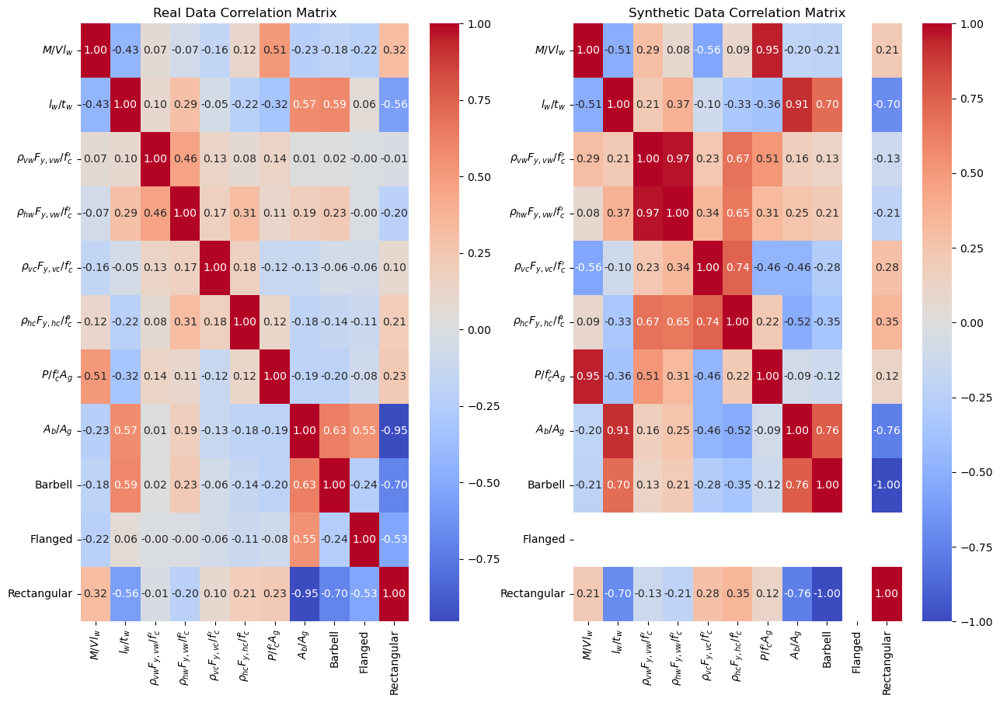

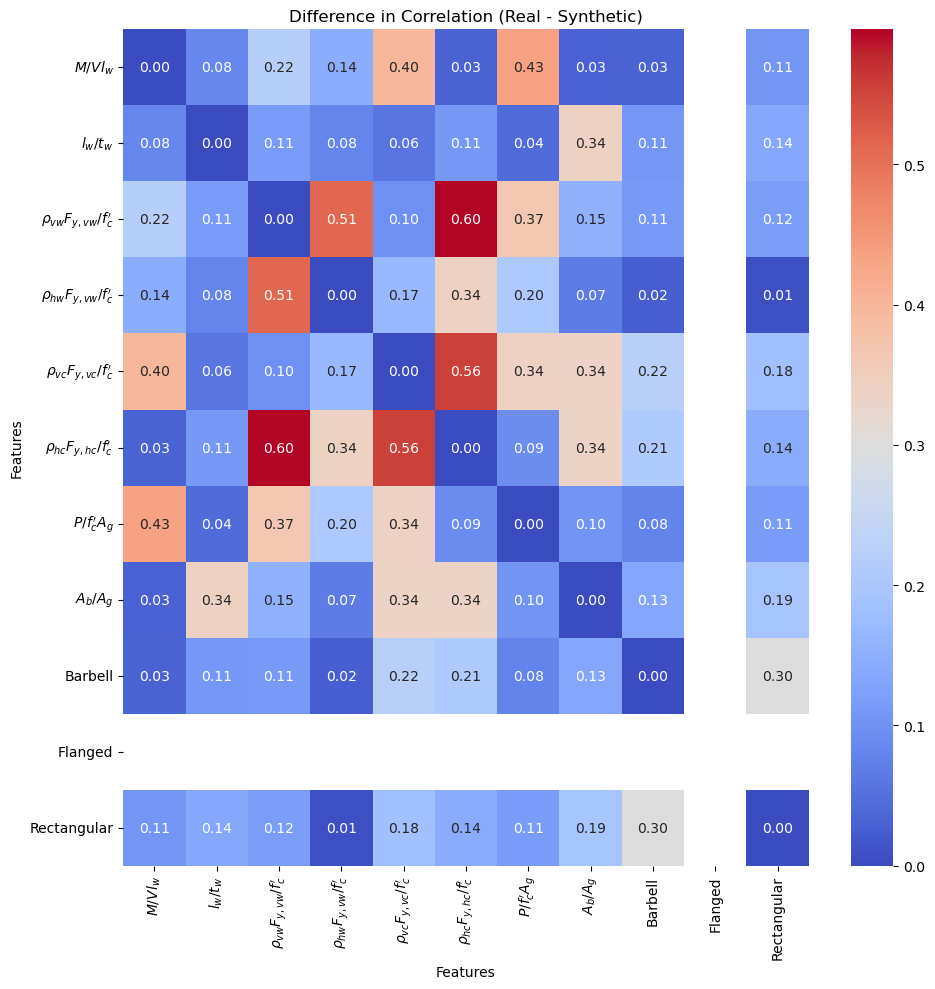

In [25]:
corrmap_comparison(X, recon_df, rename_dict=rename_dict)#, filename_prefix='pca')

## OOD and ID Prediction

In [26]:
features=processed_df.values
label=df['FailureMode'] - 1 # starts from 0

In [27]:
# split data into train and test
num_classes = len(label.unique())
id_feature = np.array(features)
id_label = np.array(label) 

X, y = {}, {}
X['train'], X['test'], y['train'], y['test'] = train_test_split(id_feature, id_label, test_size=0.3, random_state=0)

# Apply SMOTE to handle imbalance dataset
smote = SMOTE(random_state=42)
X['train-smote'], y['train-smote'] = smote.fit_resample(X['train'], y['train'])

In [28]:
# transform numpy arrays into tensor arrays
X = numpy_to_tensor(X, dtype=torch.float32)
y = numpy_to_tensor(y, dtype=torch.int64)

In [29]:
%%time
# Train VAE model to generate latent space
set_random_seed(0)

layers_dim = [128, 64, 32, 3]  # Encoder and Decoder layer sizes
batch_size = 64
epochs = 500
iter_vae = epochs # if = epoch return to vae
learning_rate = 2e-4
num_var = len_numerical + sum(len_ohes)

vae = VAE(len_numerical, len_ohes, layers_dim=layers_dim, batch_norm=True, activation='relu', dropout_rate=0.0)

vae.train_model(X['train'], lr_e=learning_rate, lr_d=learning_rate, batch_size=batch_size, n_iter=epochs, iter_vae=iter_vae, 
                    beta_kl=0.5, beta_rec=1.0)

vae.eval()
with torch.no_grad():
    mu, _, _, recon_data = vae(X['train'])

100%|██████████| 500/500 [00:10<00:00, 45.92it/s]

CPU times: total: 1min 16s
Wall time: 10.9 s


In [30]:
# generate ood sample and transform back into original distribution
min_dist = 1.5
offset = 0.5
softness = 1

max_rad = max(l2dist(mu))[0]
far_rad_in = max_rad + 3
far_rad_out = far_rad_in + 10

# hard brownian offset guarantee samples at least d_min distance away from rest of sample
ood_lv_train = soft_brownian_offset(mu.numpy(), d_min=min_dist, d_off=offset, softness=softness, n_samples = len(X['train']))
X['ood-train'] = vae.sample(tensor(ood_lv_train, dtype=torch.float32)).detach()

ood_lv = soft_brownian_offset(mu.numpy(), d_min=min_dist, d_off=offset, softness=softness, n_samples = len(X['test'])//4)
X['ood-test'] = vae.sample(tensor(ood_lv, dtype=torch.float32)).detach()

lv_far = generate_nd_gaussian(far_rad_in, far_rad_out, d=3, num_samples=len(X['test'])//4)
X['ood-far-test'] = vae.sample(tensor(lv_far, dtype=torch.float32)).detach()

In [31]:
Xnum = tensor_to_numpy(X)
ynum = tensor_to_numpy(y)

In [32]:
X['train-cat'] = torch.cat((X['train-smote'], X['ood-train']), dim=0)
y['train-cat'] = torch.cat((y['train-smote'] + 1, torch.zeros(len(X['ood-train']), dtype=torch.long)), dim=0)
X['test-cat'] = torch.cat((X['test'], X['ood-test']), dim=0)
y['test-cat'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']), dtype=torch.long)), dim=0)
X['test-far-cat'] = torch.cat((X['test'], X['ood-test'], X['ood-far-test']), axis=0)
y['test-far-cat'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']) + len(X['ood-far-test']), dtype=torch.long)), dim=0)
y['mask'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']), dtype=torch.long) ,-torch.ones(len(X['ood-far-test']), dtype=torch.long)), dim=0)

Xnum['train-cat'] = np.concatenate((Xnum['train-smote'], Xnum['ood-train']), axis=0)
ynum['train-cat'] = np.concatenate((ynum['train-smote'] + 1, np.zeros(len(Xnum['ood-train']), dtype=np.int64)), axis=0)
Xnum['test-cat'] = np.concatenate((Xnum['test'], Xnum['ood-test']), axis=0)
ynum['test-cat'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']), dtype=np.int64)), axis=0)
Xnum['test-far-cat'] = np.concatenate((Xnum['test'], Xnum['ood-test'], Xnum['ood-far-test']), axis=0)
ynum['test-far-cat'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']) +len(Xnum['ood-far-test']), dtype=np.int64)), axis=0)
ynum['mask'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']), dtype=np.int64) ,-np.ones(len(Xnum['ood-far-test']), dtype=np.int64)), axis=0)

Xnum['train-cat'] = np.concatenate((Xnum['train'], Xnum['ood-train']), axis=0)
ynum['train-cat'] = np.concatenate((ynum['train'] + 1, np.zeros(len(Xnum['ood-train']), dtype=np.int64)), axis=0)

In [33]:
test = ClassificationComparison(y['test-cat'])
test_far = ClassificationComparison(y['test-far-cat'])

class_names = ["OOD", "F", "FS", "S", "SL"]
models = {}

### MLP

In [34]:
%%time
set_random_seed(0)
module = MLP(X['train'].shape[1], [256, 512, 512, 512, 256], 'relu', 0.0, num_classes)

module.train_model_oe(X['train'], y['train'], X['ood-train'], num_epochs=500)

100%|██████████| 500/500 [00:26<00:00, 19.21it/s]

CPU times: total: 3min 2s
Wall time: 26 s


In [35]:
params = dict(k_knn=5, x_train=X['train-smote'], y_train=y['train-smote'],
batch_size=128, n_classes=num_classes, vim_dim=64, lr=learning_rate)

In [36]:
detectors = ['MSP', 'KNN', 'OpenMax', 'MDS', 'RMDS', 'odin', 'gram', 'ebo',
             'gradnorm',  'mls', 'vim', 'dice', 'ash', 'she_inner']
all_metrics = pd.DataFrame()
columns = ['FPR@95', 'AUROC', 'AUPR_IN', 'AUPR_OUT', 'Accuracy']
detector_params = dict(k_knn=5, x_train=X['train-smote'], y_train=y['train-smote'],
                       batch_size=128, n_classes=num_classes, vim_dim=64, lr=learning_rate)

for detector in detectors:
    score_function = detection_method(detector=detector, model=module, **detector_params)
    metrics = get_ood_score(model=module, in_test_features=X['test'], in_test_labels=y['test'], score_function=score_function, 
                  out_features=torch.cat((X['ood-test'], X['ood-far-test'])), missclass_as_ood=False)
    
    # Convert the metrics to a DataFrame and add the detector name as the index
    metrics_df = pd.DataFrame([metrics], index=[detector], columns=columns)  # Convert the metrics into a 1-row DataFrame
    
    # Concatenate the new metrics with the existing all_metrics DataFrame
    all_metrics = pd.concat([all_metrics, metrics_df])
all_metrics = all_metrics * 100 

In [37]:
all_metrics.style.apply(highlight_ood_metrics, axis=0)

,FPR@95,AUROC,AUPR_IN,AUPR_OUT,Accuracy
MSP,5.932203,98.626534,99.416646,96.368174,81.355932
KNN,4.237288,98.319696,99.291751,95.581734,81.355932
OpenMax,15.254237,85.885447,95.047816,56.583397,66.101695
MDS,86.440678,42.080655,66.447240,27.747137,81.355932
RMDS,20.338983,87.507306,94.432554,64.679806,81.355932
odin,5.084746,98.787259,99.495798,96.649156,81.355932
gram,68.644068,65.677966,88.689330,70.863309,81.355932
ebo,4.237288,97.004676,98.938487,83.474639,81.355932
gradnorm,5.084746,99.035652,99.583699,97.740872,81.355932
mls,5.084746,98.071303,99.249456,90.292042,81.355932


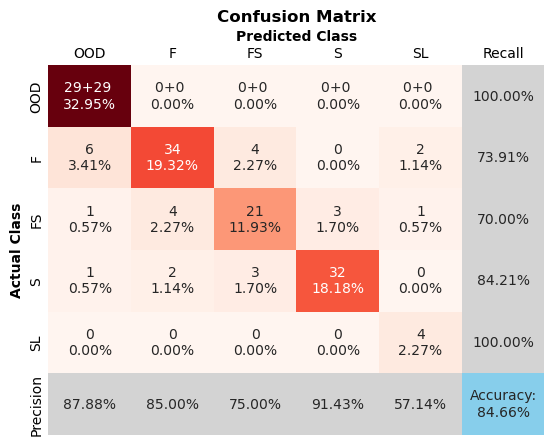

CPU times: total: 2.16 s
Wall time: 573 ms


In [38]:
%%time
name = "MLP+OE_dice"
models[name] = module

# y['train-pred'] = module.predict_with_ood(X['train-cat'], detector="odin", threshold_method = 'roc')
# out = extended_confusion_matrix(y['train-cat'], y['train-pred'])

# y['test-pred'] = module.predict_with_ood(X['test-cat'], detector="gradnorm", threshold_method='roc', **detector_params)
# out = extended_confusion_matrix(y['test-cat'], y['test-pred'])
# test.calculate_metrics(y['test-pred'], name)

y['test-pred'] = module.predict_with_ood(X['test-far-cat'], detector="dice", threshold_method='roc', **detector_params)
out = extended_confusion_matrix(y['test-far-cat'], y['test-pred'], y_mask=y['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(y['test-pred'], name)

### Paper

In [39]:
%%time
set_random_seed(0)
module = MLP(X['train'].shape[1], [1000, 500, 250, 500, 1000], 'relu', 0.0, num_classes)

module.train_model_oe(X['train-smote'], y['train-smote'], X['ood-train'], num_epochs=500)

100%|██████████| 500/500 [01:01<00:00,  8.17it/s]

CPU times: total: 7min 9s
Wall time: 1min 1s


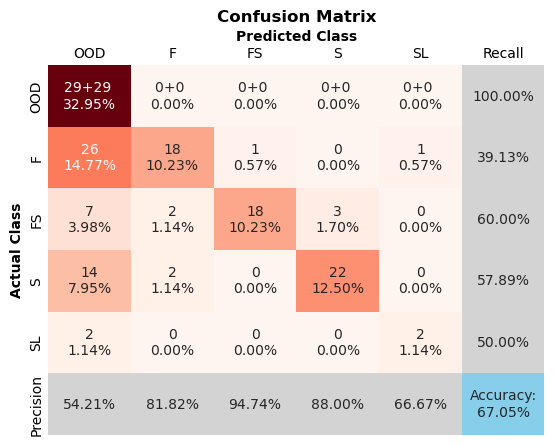

CPU times: total: 1.77 s
Wall time: 545 ms


In [40]:
%%time
name = "Paper"
models[name] = module

# y['train-pred'] = module.predict_with_ood(X['train-cat'], detector="MSP", threshold_method = 'percentile')
# out = extended_confusion_matrix(y['train-cat'], y['train-pred'])

# y['test-pred'] = module.predict_with_ood(X['test-cat'], detector="MSP", threshold_method = 'percentile')
# out = extended_confusion_matrix(y['test-cat'], y['test-pred'])
# test.calculate_metrics(y['test-pred'], name)

y['test-pred'] = module.predict_with_ood(X['test-far-cat'], detector="MSP", threshold_method = 'percentile')
out = extended_confusion_matrix(y['test-far-cat'], y['test-pred'], y_mask=y['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(y['test-pred'], name)

### XGBoost

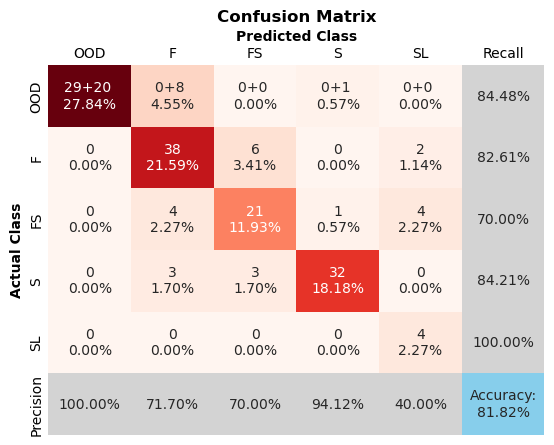

CPU times: total: 3.64 s
Wall time: 658 ms


In [41]:
%%time
set_random_seed(0)
xgbmodel = OODModel(model_type='xgboost', use_class_weight=False, hierarchical_model=True)
xgbmodel.train(Xnum['train-smote'], ynum['train-smote'], Xnum['ood-train'])

name = "XGB-smote"
models[name] = xgbmodel

# ynum['train-pred'] = xgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = xgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = xgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

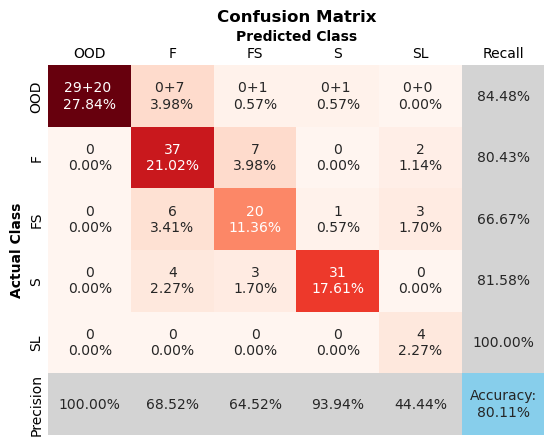

CPU times: total: 3.45 s
Wall time: 649 ms


In [42]:
%%time
set_random_seed(0)
xgbmodel = OODModel(model_type='xgboost', use_class_weight=True, hierarchical_model=True)
xgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "XGB-weight"
models[name] = xgbmodel

# ynum['train-pred'] = xgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = xgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = xgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

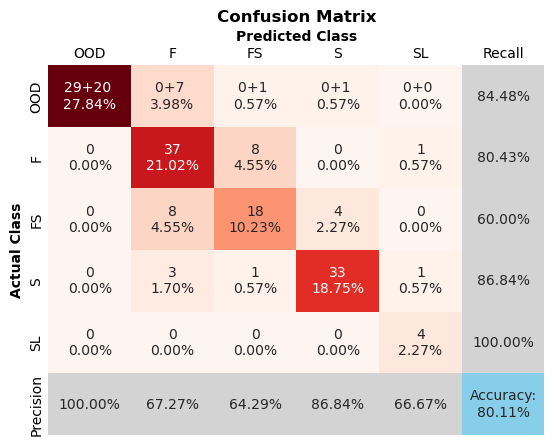

CPU times: total: 3.61 s
Wall time: 667 ms


In [43]:
%%time
set_random_seed(0)
xgbmodel = OODModel(model_type='xgboost', use_class_weight=False, hierarchical_model=True)
xgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "XGB"
models[name] = xgbmodel

# ynum['train-pred'] = xgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = xgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = xgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

### CatBoost

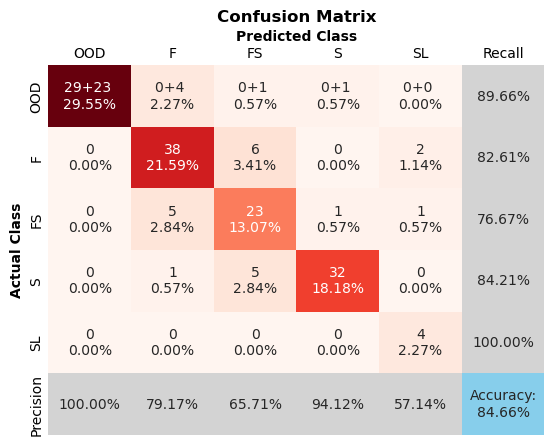

CPU times: total: 3.19 s
Wall time: 4.7 s


In [44]:
%%time
set_random_seed(0)
catmodel = OODModel(model_type='catboost', use_class_weight=False, hierarchical_model=True)
catmodel.train(Xnum['train-smote'], ynum['train-smote'], Xnum['ood-train'], verbose=False)

name = "CB-smote"
models[name] = catmodel

# ynum['train-pred'] = catmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = catmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = catmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

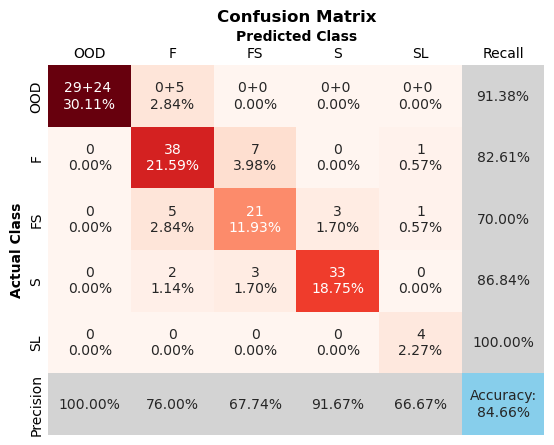

CPU times: total: 3.17 s
Wall time: 4.19 s


In [45]:
%%time
set_random_seed(0)
catmodel = OODModel(model_type='catboost', use_class_weight=True, hierarchical_model=True)
catmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'], verbose=False)

name = "CB-weight"
models[name] = catmodel

# ynum['train-pred'] = catmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = catmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = catmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

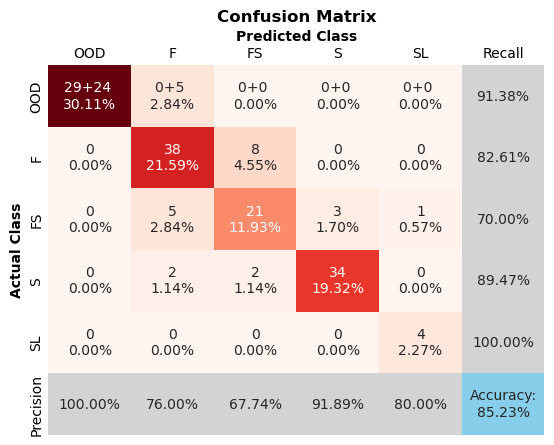

CPU times: total: 2.98 s
Wall time: 4.18 s


In [46]:
%%time
set_random_seed(0)
catmodel = OODModel(model_type='catboost', use_class_weight=False, hierarchical_model=True)
catmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'], verbose=False)

name = "CB"
models[name] = catmodel

# ynum['train-pred'] = catmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = catmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = catmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

### LightGBM

C:\Users\E2-415\anaconda3\envs\my_env\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning:

Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.

  File "C:\Users\E2-415\anaconda3\envs\my_env\lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


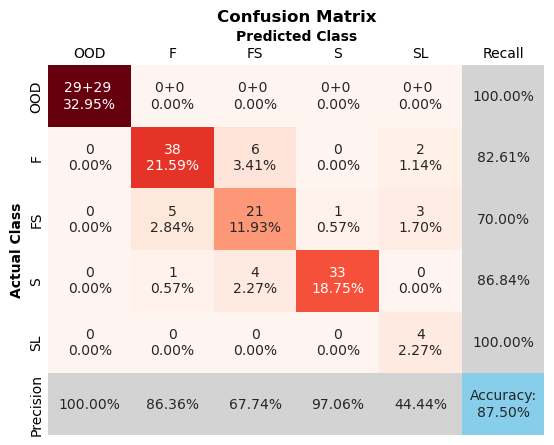

CPU times: total: 3.92 s
Wall time: 874 ms


In [47]:
%%time
set_random_seed(0)
lgbmodel = OODModel(model_type='lightgbm', use_class_weight=False, hierarchical_model=True)
lgbmodel.train(Xnum['train-smote'], ynum['train-smote'], Xnum['ood-train'])

name = "LGB-smote"
models[name] = lgbmodel

# ynum['train-pred'] = lgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = lgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = lgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

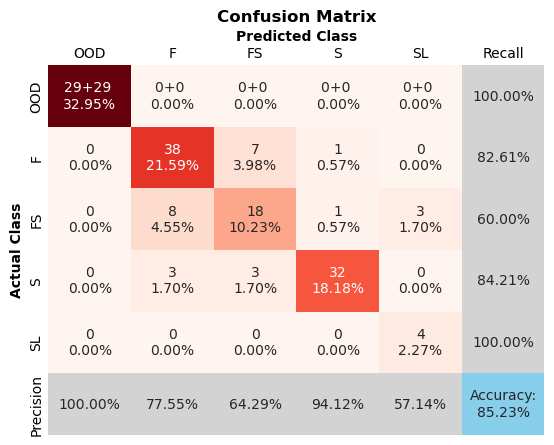

CPU times: total: 2.73 s
Wall time: 601 ms


In [48]:
%%time
set_random_seed(0)
lgbmodel = OODModel(model_type='lightgbm', use_class_weight=True, hierarchical_model=True)
lgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "LGB-weight"
models[name] = lgbmodel

# ynum['train-pred'] = lgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = lgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = lgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

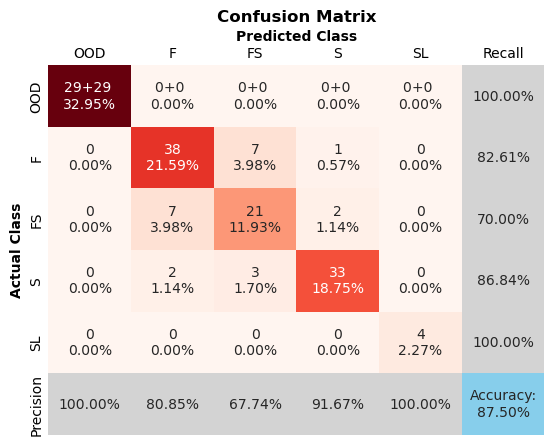

CPU times: total: 2.75 s
Wall time: 605 ms


In [49]:
%%time
set_random_seed(0)
lgbmodel = OODModel(model_type='lightgbm', use_class_weight=False, hierarchical_model=True)
lgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "LGB"
models[name] = lgbmodel

# ynum['train-pred'] = lgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = lgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = lgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

In [51]:
test_far.get_metrics()

,Macro Precision,Macro Recall,Macro F1-Score,Accuracy
Method,,,,
MLP+OE_dice,0.792900,0.856247,0.810861,0.846591
Paper,0.770855,0.614050,0.647395,0.670455
XGB-smote,0.751632,0.842604,0.768776,0.818182
XGB-weight,0.742837,0.826326,0.760050,0.801136
XGB,0.770134,0.823519,0.787534,0.801136
CB-smote,0.792283,0.866282,0.815564,0.846591
CB-weight,0.804151,0.861660,0.825408,0.846591
CB,0.831268,0.866923,0.846140,0.852273
LGB-smote,0.791218,0.878902,0.813004,0.875000


In [52]:
all_metrics = pd.DataFrame()
columns = ['FPR@95', 'AUROC', 'AUPR_IN', 'AUPR_OUT', 'ID Accuracy']
for model_name in models:
    model = models[model_name]
    if isinstance(model, OODModel):
        metrics = get_ood_score_boost(model, Xnum['test'], ynum['test'], np.concatenate((Xnum['ood-test'], Xnum['ood-far-test']), axis=0))
    else:
        if model_name == 'Paper':
            detector = 'MSP'
        else:
            detector = model_name.split('_')[1]
        
        score_function = detection_method(detector=detector, model=model, k_knn=5, x_train=X['train-smote'], y_train=y['train-smote'], 
                                      batch_size=128, n_classes=num_classes, vim_dim=64, lr=learning_rate)
        metrics = get_ood_score(model=model, in_test_features=X['test'], in_test_labels=y['test'], score_function=score_function, 
                  out_features=torch.cat((X['ood-test'], X['ood-far-test']), axis=0), missclass_as_ood=False)
    
    metrics_df = pd.DataFrame([metrics], index=[model_name], columns=columns)  # Convert the metrics into a 1-row DataFrame
    
    all_metrics = pd.concat([all_metrics, metrics_df])
all_metrics = all_metrics * 100 

In [53]:
all_metrics.style.apply(highlight_ood_metrics, axis=0)

,FPR@95,AUROC,AUPR_IN,AUPR_OUT,ID Accuracy
MLP+OE_dice,4.237288,99.196376,99.642526,98.212300,80.508475
Paper,13.559322,97.757160,98.851481,96.207053,84.745763
XGB-smote,0.847458,99.810053,99.906941,99.632711,80.508475
XGB-weight,0.000000,99.152542,99.443974,99.090358,77.966102
XGB,0.000000,99.152542,99.443974,99.090358,77.966102
CB-smote,0.000000,100.000000,100.000000,100.000000,82.203390
CB-weight,0.000000,100.000000,100.000000,100.000000,81.355932
CB,0.000000,100.000000,100.000000,100.000000,82.203390
LGB-smote,0.000000,100.000000,100.000000,100.000000,81.355932
LGB-weight,0.000000,100.000000,100.000000,100.000000,77.966102


# Bridge Tagging

In [54]:
file_path = r'C:\Users\E2-415\Desktop\Databases\Bridge dataset.xlsx'
problem_name = "_BT"
df2 = pd.read_excel(file_path)
df2.head()

,X1,X2,X3,X4,X5,X6,X7,X9,X8,X10,...,X13,X14,X15,X16,X17,X18,X19,X20,X21,Y
0,44.971492,18.247541,30.693913,469.086924,7.915522,0.025351,422.815998,1.295880,0.816587,5.444734,...,1.087264,0.054622,2,0.170517,0.442484,0.241954,10.774654,3.590439,1.097036,0
1,60.140854,17.809083,37.264213,533.616655,6.486088,0.016072,179.523813,0.786103,3.269385,3.846675,...,1.019205,0.061542,1,0.427709,0.312937,0.164976,10.815358,0.783233,0.990123,2
2,30.571931,17.386377,26.834816,431.185078,8.323085,0.027038,128.194101,1.124079,0.934619,3.827775,...,1.021480,0.035817,2,0.444432,1.134343,0.451155,42.870555,35.281881,0.913632,1
3,41.408870,17.433227,25.659810,419.644842,8.219384,0.026661,368.343563,1.095994,2.672667,3.582685,...,1.061265,0.042044,1,0.362607,0.845263,0.385786,15.821361,11.135341,1.195794,2
4,53.444701,19.729893,31.284727,474.889567,6.246412,0.014537,83.140438,0.789106,2.835088,4.051574,...,0.992220,0.049227,2,0.362776,0.810758,0.376524,18.078815,14.848802,1.089014,2


In [55]:
print_ranges(df2)

            Min         Max
X1    22.927311   68.059998
X2    15.246855   20.108585
X3    23.661585   38.959458
X4   400.019417  550.266383
X5     5.205514    9.737874
X6     0.010006    0.029978
X7    70.291902  437.488327
X9     0.670367    1.498716
X8     0.542384    3.383007
X10    2.898521    6.227166
X11    0.059311    0.230678
X12    1.000000    2.000000
X13    0.950052    1.149692
X14    0.020116    0.069540
X15    1.000000    2.000000
X16    0.013081    2.497729
X17    0.233728    1.427922
X18    0.100122    0.498266
X19    7.641660   55.793774
X20    0.021576   38.049661
X21    0.801388    1.198302
Y      0.000000    2.000000


In [56]:
# make X12 & X15 to string to make it categorical
col = ['X12','X15']
df2[col] = df2[col].astype(str)

In [57]:
X=df2.loc[:, df2.columns != 'Y']
y=df2['Y']

In [58]:
processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'standard')

print("Processed DataFrame:")
print(processed_df)

print("\nLength of Numerical Columns:")
print(len_numerical)

print("\nLength of Categorical Columns:")
print(len_ohes)

Processed DataFrame:
           X1        X2        X3        X4        X5        X6        X7  \
0    0.269987  0.443288 -0.169834 -0.185313  0.748741  0.926639  2.018261   
1    1.824762  0.122692  1.703146  1.721051 -0.654338 -0.680312 -0.361327   
2   -1.205888 -0.186385 -1.269938 -1.305024  1.148790  1.218805 -0.863371   
3   -0.095162 -0.152128 -1.604894 -1.645951  1.047000  1.153481  1.485478   
4    1.138444  1.527166 -0.001412 -0.013889 -0.889595 -0.946321 -1.304031   
..        ...       ...       ...       ...       ...       ...       ...   
475 -0.814737 -1.325475  1.437025  1.450186 -1.460719 -1.431204 -1.357976   
476  2.152134 -0.796544  0.569550  0.567249 -1.445478 -1.421724  1.980216   
477  0.690199  1.128491  1.225089  1.234473 -0.596896 -1.674780  0.538794   
478  0.293032  1.310897  0.604162  0.602478 -0.317209 -0.263129 -1.047341   
479 -0.462746 -0.751515  1.606413  1.622593 -1.786314 -1.589514 -0.487351   

           X9        X8       X10  ...       X16      

## Comparison on Data Generation

### VAE

In [59]:
x_train = tensor(processed_df.values, dtype=torch.float32)

layers_dim = [128, 64, 32, 3]  # Encoder and Decoder layer sizes
batch_size = 32
epochs = 500
iter_vae = epochs # if = epoch return to vae
learning_rate = 5e-3
num_var = len_numerical + sum(len_ohes)

vae = VAE(len_numerical, len_ohes, layers_dim=layers_dim, batch_norm=True, activation='relu', dropout_rate=0.0)

vae.train_model(x_train, lr_e=learning_rate, lr_d=learning_rate, batch_size=batch_size, n_iter=epochs, iter_vae=iter_vae, 
                    beta_kl=0.5, beta_rec=1.0)

100%|██████████| 500/500 [00:32<00:00, 15.48it/s]


In [60]:
vae.eval()
with torch.no_grad():
    mu, _, _, recon_data = vae(x_train)

In [61]:
mse_loss(recon_data, x_train)

tensor(0.4363)

In [62]:
plot_embed(mu,y)

#### Sample Generation

In [63]:
z_sample = torch.randn(size=(x_train.shape[0], layers_dim[-1]))
synth_data = vae.sample(z_sample)

In [64]:
recon_df = reverse_process_dataframe(synth_data, len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols']
recon_df[cols] = recon_df[cols].clip(lower=0)

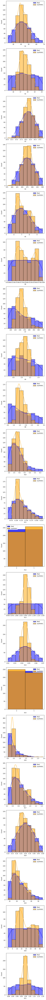

In [65]:
distribution_comparison(X, recon_df, stacked=True)

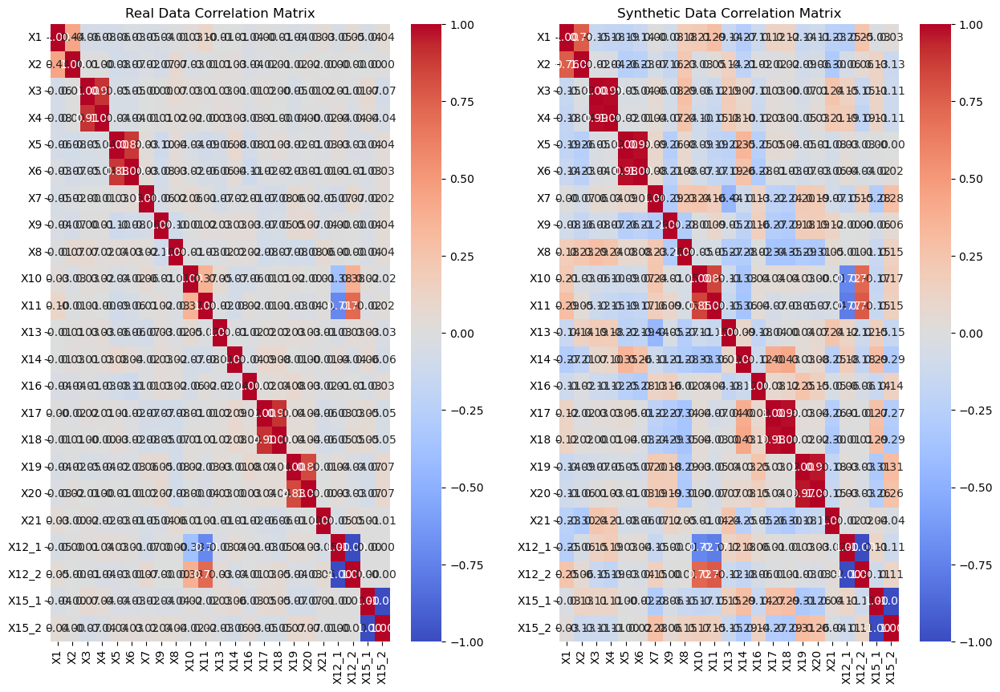

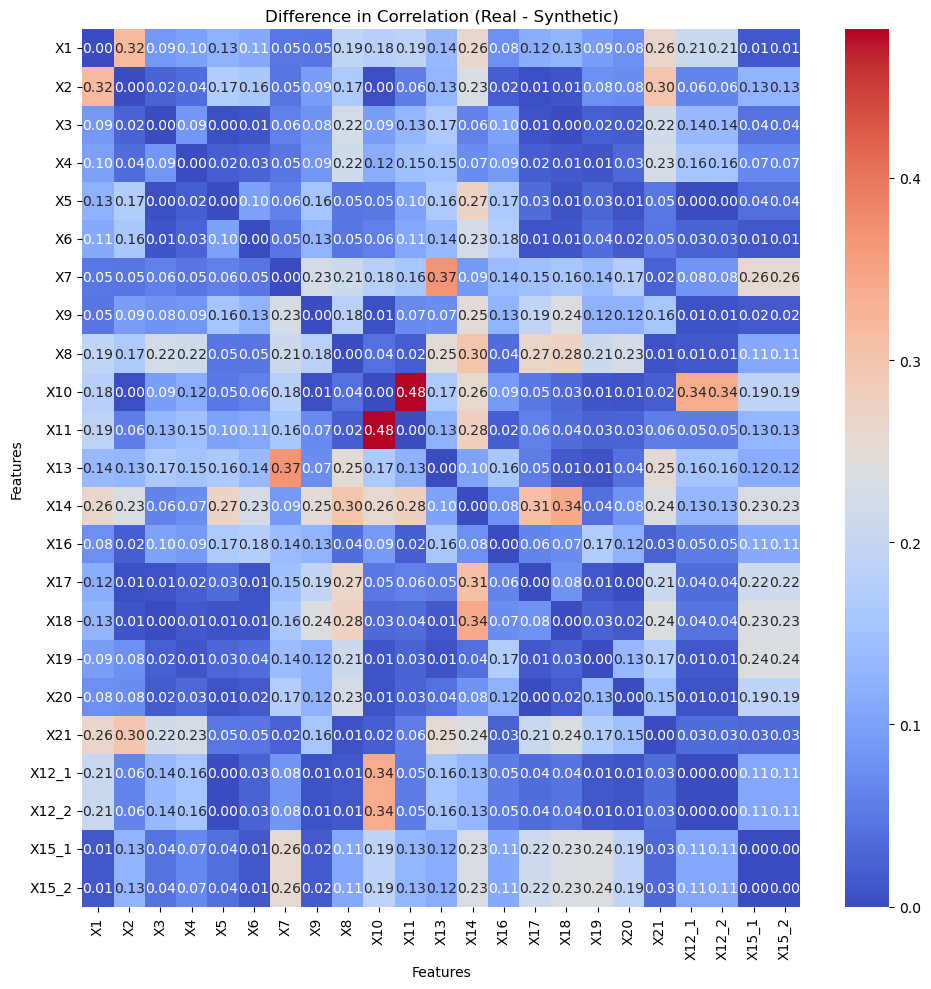

In [66]:
corrmap_comparison(X, recon_df)

#### OOD Generation

In [67]:
latent_var = mu.numpy()

# hard brownian offset guarantee samples at leat d_min distance away from rest of sample
ood = soft_brownian_offset(latent_var, d_min=2, d_off=0.5, softness=0, n_samples = len(x_train))

x_ood = np.concatenate((latent_var,ood), axis = 0)
y_ood = ['ID']*len(y) +['OOD'] *len(x_train)
plot_embed(x_ood,y_ood)

In [68]:
synth_data = vae.sample(tensor(ood, dtype=torch.float32))

recon_df = reverse_process_dataframe(synth_data, len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols']
recon_df[cols] = recon_df[cols].clip(lower=0)

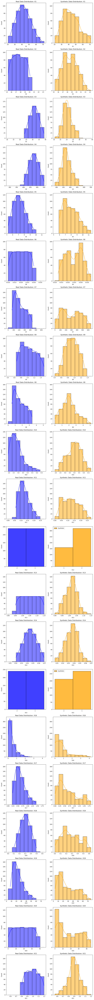

In [69]:
distribution_comparison(X, recon_df, stacked=False)

### PCA

In [70]:
n_latent = layers_dim[-1]
pca = PCA(n_components=n_latent)
latent_var = pca.fit_transform(processed_df.values)
rec_X = pca.inverse_transform(latent_var)

In [71]:
plot_embed(latent_var, y)

In [72]:
mse_loss(tensor(rec_X), x_train)

tensor(0.6094, dtype=torch.float64)

In [73]:
lv_sample=generate_nd_ball_sample(processed_df.shape[0], n_latent, max(l2dist(rec_X))[0])
synth_data = pca.inverse_transform(lv_sample)

In [74]:
recon_df = reverse_process_dataframe(tensor(synth_data), len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols']
recon_df[cols] = recon_df[cols].clip(lower=0)

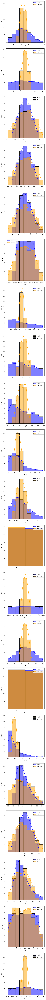

In [75]:
distribution_comparison(X, recon_df, stacked=True)

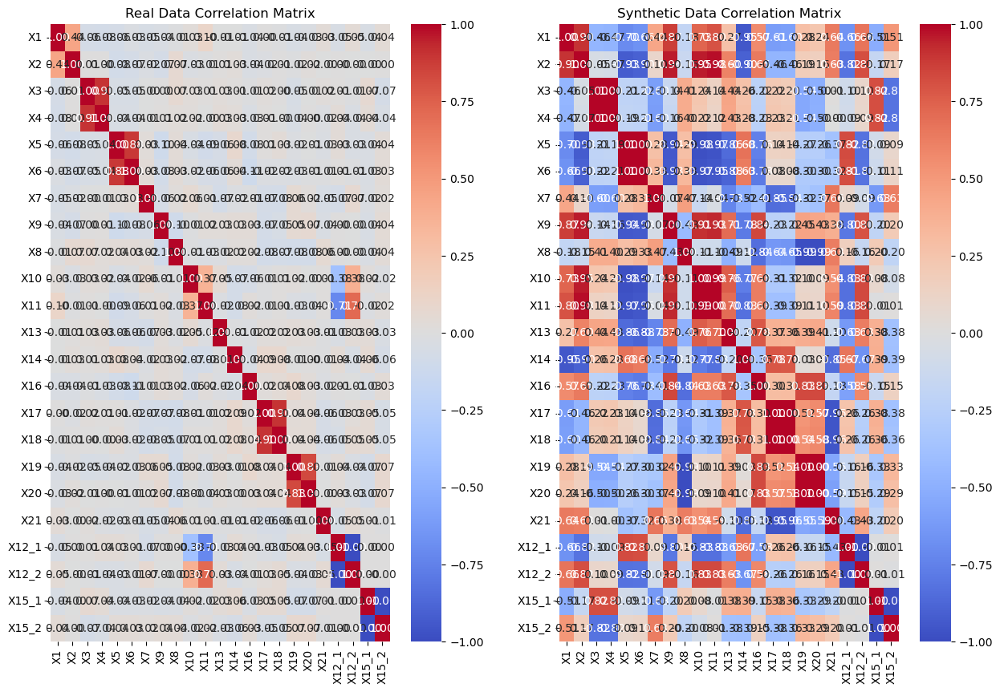

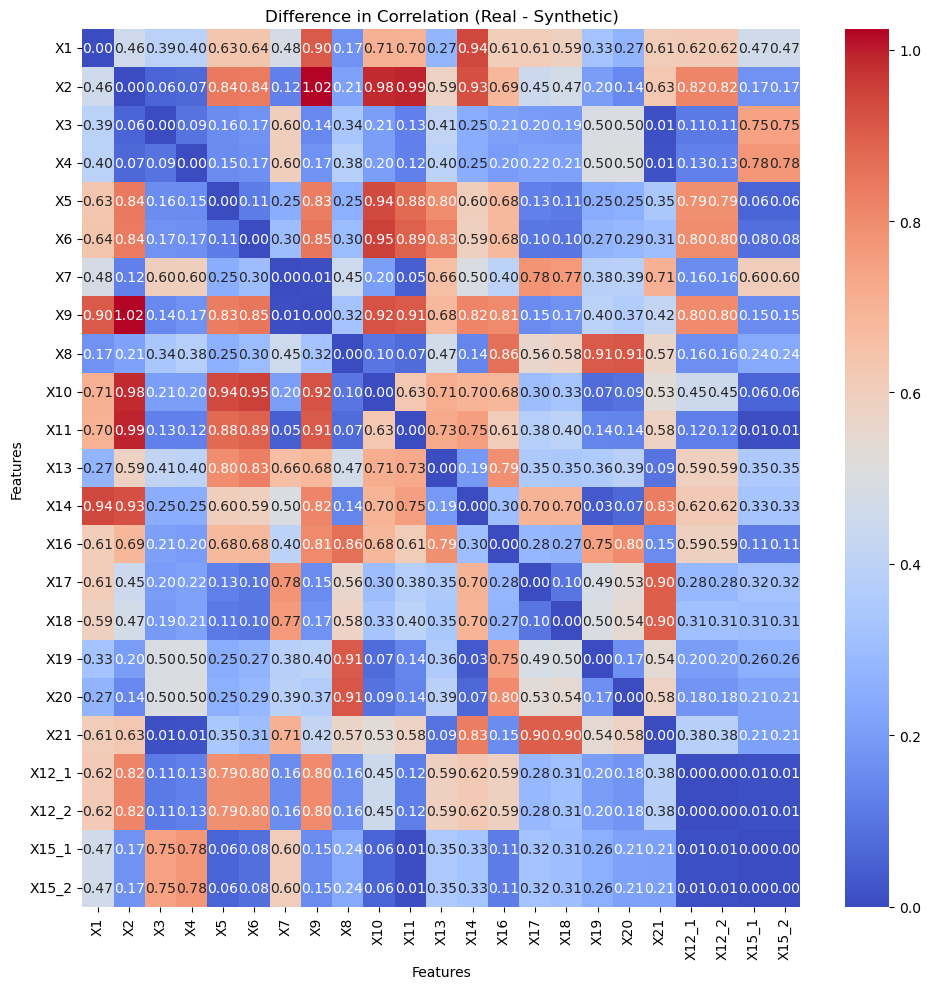

In [76]:
corrmap_comparison(X, recon_df)

## OOD and ID Prediction

In [77]:
features=processed_df.values
label=df2['Y']

In [78]:
# split data into train and test
num_classes = len(label.unique())
id_feature = np.array(features)
id_label = np.array(label) 

X, y = {}, {}
X['train'], X['test'], y['train'], y['test'] = train_test_split(id_feature, id_label, test_size=0.3, random_state=0)

# Apply SMOTE to handle imbalance dataset
smote = SMOTE(random_state=42)
X['train-smote'], y['train-smote'] = smote.fit_resample(X['train'], y['train'])

In [79]:
# transform numpy arrays into tensor arrays
X = numpy_to_tensor(X, dtype=torch.float32)
y = numpy_to_tensor(y, dtype=torch.int64)

In [80]:
%%time
# Train VAE model to generate latent space
set_random_seed(0)

layers_dim = [128, 64, 32, 3]  # Encoder and Decoder layer sizes
batch_size = 64
epochs = 500
iter_vae = epochs # if = epoch return to vae
learning_rate = 2e-4
num_var = len_numerical + sum(len_ohes)

vae = VAE(len_numerical, len_ohes, layers_dim=layers_dim, batch_norm=True, activation='relu', dropout_rate=0.0)

vae.train_model(X['train'], lr_e=learning_rate, lr_d=learning_rate, batch_size=batch_size, n_iter=epochs, iter_vae=iter_vae, 
                    beta_kl=0.5, beta_rec=1.0)

vae.eval()
with torch.no_grad():
    mu, _, _, recon_data = vae(X['train'])

100%|██████████| 500/500 [00:13<00:00, 37.77it/s]

CPU times: total: 1min 35s
Wall time: 13.2 s


In [81]:
# generate ood sample and transform back into original distribution
min_dist = 1.5
offset = 0.5
softness = 1

max_rad = max(l2dist(mu))[0]
far_rad_in = max_rad + 3
far_rad_out = far_rad_in + 10

# hard brownian offset guarantee samples at least d_min distance away from rest of sample
ood_lv_train = soft_brownian_offset(mu.numpy(), d_min=min_dist, d_off=offset, softness=softness, n_samples = len(X['train']))
X['ood-train'] = vae.sample(tensor(ood_lv_train, dtype=torch.float32)).detach()

ood_lv = soft_brownian_offset(mu.numpy(), d_min=min_dist, d_off=offset, softness=softness, n_samples = len(X['test'])//4)
X['ood-test'] = vae.sample(tensor(ood_lv, dtype=torch.float32)).detach()

lv_far = generate_nd_gaussian(far_rad_in, far_rad_out, d=3, num_samples=len(X['test'])//4)
X['ood-far-test'] = vae.sample(tensor(lv_far, dtype=torch.float32)).detach()

In [82]:
Xnum = tensor_to_numpy(X)
ynum = tensor_to_numpy(y)

In [83]:
X['train-cat'] = torch.cat((X['train-smote'], X['ood-train']), dim=0)
y['train-cat'] = torch.cat((y['train-smote'] + 1, torch.zeros(len(X['ood-train']), dtype=torch.long)), dim=0)
X['test-cat'] = torch.cat((X['test'], X['ood-test']), dim=0)
y['test-cat'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']), dtype=torch.long)), dim=0)
X['test-far-cat'] = torch.cat((X['test'], X['ood-test'], X['ood-far-test']), axis=0)
y['test-far-cat'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']) + len(X['ood-far-test']), dtype=torch.long)), dim=0)
y['mask'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']), dtype=torch.long) ,-torch.ones(len(X['ood-far-test']), dtype=torch.long)), dim=0)

Xnum['train-cat'] = np.concatenate((Xnum['train-smote'], Xnum['ood-train']), axis=0)
ynum['train-cat'] = np.concatenate((ynum['train-smote'] + 1, np.zeros(len(Xnum['ood-train']), dtype=np.int64)), axis=0)
Xnum['test-cat'] = np.concatenate((Xnum['test'], Xnum['ood-test']), axis=0)
ynum['test-cat'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']), dtype=np.int64)), axis=0)
Xnum['test-far-cat'] = np.concatenate((Xnum['test'], Xnum['ood-test'], Xnum['ood-far-test']), axis=0)
ynum['test-far-cat'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']) +len(Xnum['ood-far-test']), dtype=np.int64)), axis=0)
ynum['mask'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']), dtype=np.int64) ,-np.ones(len(Xnum['ood-far-test']), dtype=np.int64)), axis=0)

Xnum['train-cat'] = np.concatenate((Xnum['train'], Xnum['ood-train']), axis=0)
ynum['train-cat'] = np.concatenate((ynum['train'] + 1, np.zeros(len(Xnum['ood-train']), dtype=np.int64)), axis=0)

In [84]:
test = ClassificationComparison(y['test-cat'])
test_far = ClassificationComparison(y['test-far-cat'])
class_names = ["OOD", "G", "Y", "R"]

models ={}

### MLP

In [85]:
%%time
set_random_seed(0)
module = MLP(X['train'].shape[1], [256, 512, 512, 512, 256], 'relu', 0.0, num_classes)

module.train_model_oe(X['train-smote'], y['train-smote'], X['ood-train'], num_epochs=500)

100%|██████████| 500/500 [00:46<00:00, 10.65it/s]

CPU times: total: 5min 31s
Wall time: 47 s


In [86]:
detectors = ['MSP', 'KNN', 'OpenMax', 'MDS', 'RMDS', 'odin', 'gram', 'ebo',
             'gradnorm',  'mls', 'vim', 'dice', 'ash', 'she_inner']
all_metrics = pd.DataFrame()
columns = ['FPR@95', 'AUROC', 'AUPR_IN', 'AUPR_OUT', 'Accuracy']
detector_params = dict(k_knn=5, x_train=X['train-smote'], y_train=y['train-smote'],
                       batch_size=128, n_classes=num_classes, vim_dim=64, lr=learning_rate)

for detector in detectors:
    score_function = detection_method(detector=detector, model=module, **detector_params)
    metrics = get_ood_score(model=module, in_test_features=X['test'], in_test_labels=y['test'], score_function=score_function, 
                  out_features=torch.cat((X['ood-test'], X['ood-far-test'])), missclass_as_ood=False)
    
    # Convert the metrics to a DataFrame and add the detector name as the index
    metrics_df = pd.DataFrame([metrics], index=[detector], columns=columns)  # Convert the metrics into a 1-row DataFrame
    
    # Concatenate the new metrics with the existing all_metrics DataFrame
    all_metrics = pd.concat([all_metrics, metrics_df])
all_metrics = all_metrics * 100 

In [87]:
all_metrics.style.apply(highlight_ood_metrics, axis=0)

,FPR@95,AUROC,AUPR_IN,AUPR_OUT,Accuracy
MSP,0.000000,100.000000,100.000000,100.000000,72.222222
KNN,0.000000,100.000000,100.000000,100.000000,72.222222
OpenMax,15.972222,84.326775,94.453751,55.083885,66.666667
MDS,53.472222,50.916281,79.526287,30.655949,72.222222
RMDS,21.527778,79.021991,92.410409,48.815274,72.222222
odin,0.000000,100.000000,100.000000,100.000000,72.222222
gram,60.416667,69.791667,89.930556,72.641509,38.194444
ebo,0.694444,99.305556,99.767980,93.933806,72.222222
gradnorm,0.000000,100.000000,100.000000,100.000000,72.222222
mls,0.000000,100.000000,100.000000,100.000000,72.222222


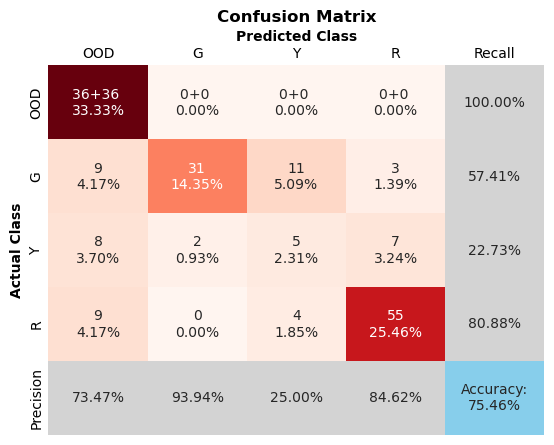

In [88]:
name = "MLP+OE_odin"
models[name] = module

# y['train-pred'] = module.predict_with_ood(X['train-cat'], detector="odin", threshold_method = 'roc')
# out = extended_confusion_matrix(y['train-cat'], y['train-pred'])

# y['test-pred'] = module.predict_with_ood(X['test-cat'], detector="MSP", threshold_method = 'roc', **detector_params)
# out = extended_confusion_matrix(y['test-cat'], y['test-pred'])
# test.calculate_metrics(y['test-pred'], name)

y['test-pred'] = module.predict_with_ood(X['test-far-cat'], detector="odin", threshold_method = 'roc', **detector_params)
out = extended_confusion_matrix(y['test-far-cat'], y['test-pred'], y_mask=y['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(y['test-pred'], name)

### Paper

In [89]:
%%time
set_random_seed(0)
module = MLP(X['train'].shape[1], [1000, 500, 250, 500, 1000], 'relu', 0.0, num_classes)

module.train_model_oe(X['train-smote'], y['train-smote'], X['ood-train'], num_epochs=500)

100%|██████████| 500/500 [01:11<00:00,  7.02it/s]

CPU times: total: 8min 17s
Wall time: 1min 11s


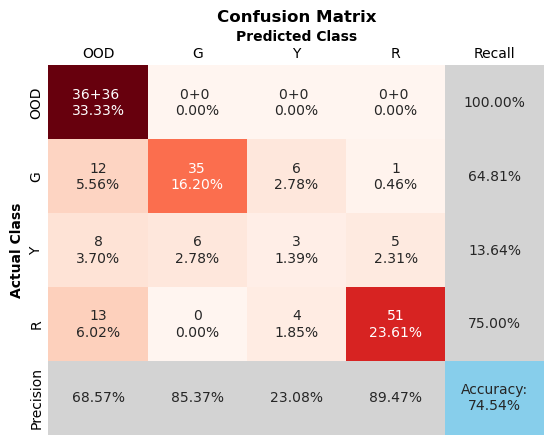

CPU times: total: 1.61 s
Wall time: 499 ms


In [90]:
%%time
name = "Paper"
models[name] = module

# y['train-pred'] = module.predict_with_ood(X['train-cat'], detector="MSP", threshold_method = 'percentile')
# out = extended_confusion_matrix(y['train-cat'], y['train-pred'])

# y['test-pred'] = module.predict_with_ood(X['test-cat'], detector="MSP", threshold_method = 'percentile')
# out = extended_confusion_matrix(y['test-cat'], y['test-pred'])
# test.calculate_metrics(y['test-pred'], name)

y['test-pred'] = module.predict_with_ood(X['test-far-cat'], detector="MSP", threshold_method = 'percentile')
out = extended_confusion_matrix(y['test-far-cat'], y['test-pred'], y_mask=y['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(y['test-pred'], name)

### XGBoost

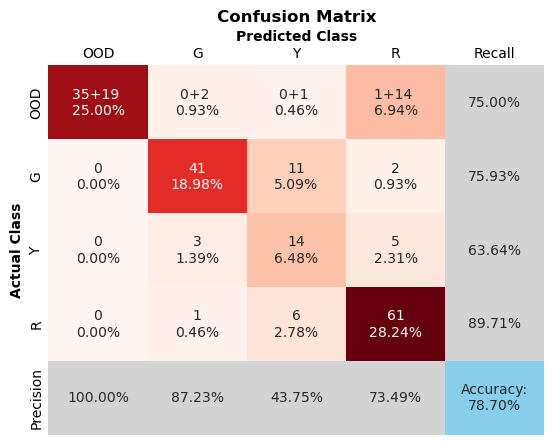

CPU times: total: 4.09 s
Wall time: 658 ms


In [91]:
%%time
set_random_seed(0)
xgbmodel = OODModel(model_type='xgboost', use_class_weight=False, hierarchical_model=True)
xgbmodel.train(Xnum['train-smote'], ynum['train-smote'], Xnum['ood-train'])

name = "XGB-smote"
models[name] = xgbmodel

# ynum['train-pred'] = xgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = xgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = xgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

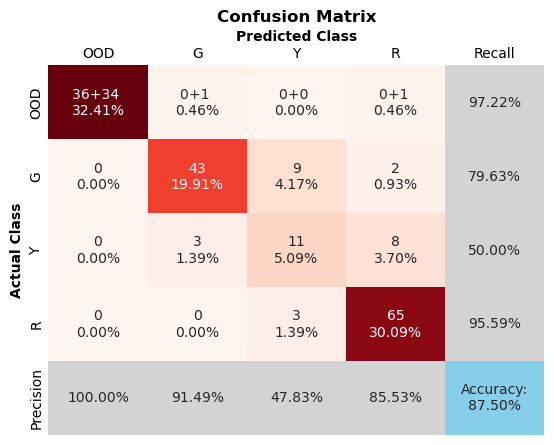

CPU times: total: 3.67 s
Wall time: 634 ms


In [92]:
%%time
set_random_seed(0)
xgbmodel = OODModel(model_type='xgboost', use_class_weight=True, hierarchical_model=True)
xgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "XGB-weight"
models[name] = xgbmodel

# ynum['train-pred'] = xgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = xgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = xgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

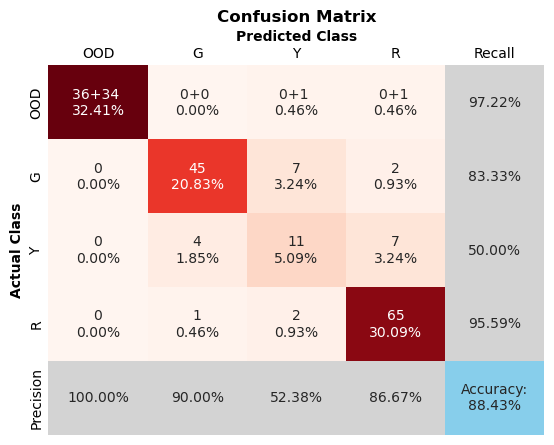

CPU times: total: 3.66 s
Wall time: 662 ms


In [93]:
%%time
set_random_seed(0)
xgbmodel = OODModel(model_type='xgboost', use_class_weight=False, hierarchical_model=True)
xgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "XGB"
models[name] = xgbmodel

# ynum['train-pred'] = xgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = xgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = xgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

### CatBoost

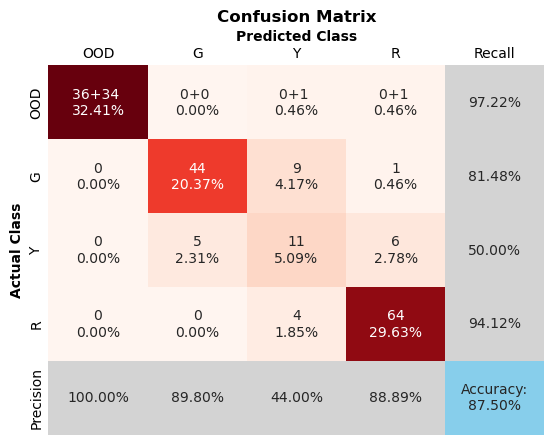

CPU times: total: 5.98 s
Wall time: 7.64 s


In [94]:
%%time
set_random_seed(0)
catmodel = OODModel(model_type='catboost', use_class_weight=False, hierarchical_model=True)
catmodel.train(Xnum['train-smote'], ynum['train-smote'], Xnum['ood-train'], verbose=False)

name = "CB-smote"
models[name] = catmodel

# ynum['train-pred'] = catmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = catmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = catmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

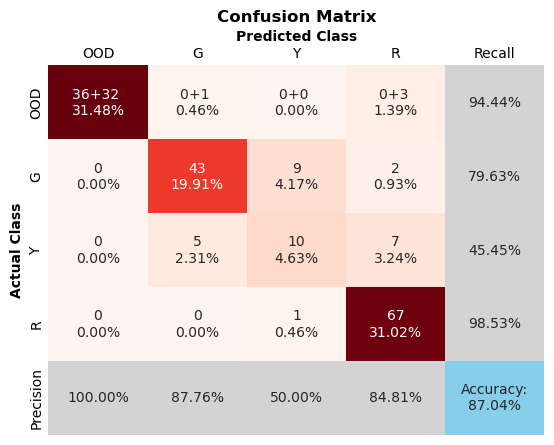

CPU times: total: 5.97 s
Wall time: 7.36 s


In [95]:
%%time
set_random_seed(0)
catmodel = OODModel(model_type='catboost', use_class_weight=True, hierarchical_model=True)
catmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'], verbose=False)

name = "CB-weight"
models[name] = catmodel

# ynum['train-pred'] = catmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = catmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = catmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

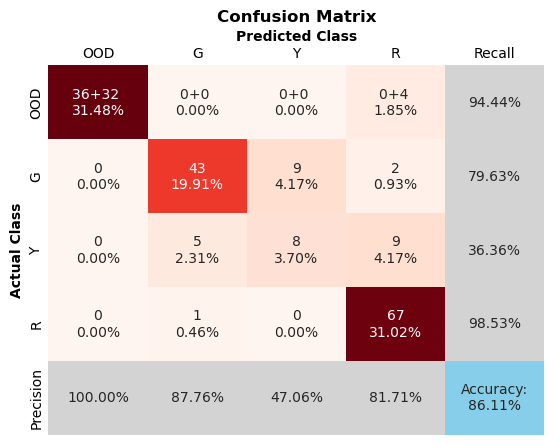

CPU times: total: 6.09 s
Wall time: 7.19 s


In [96]:
%%time
set_random_seed(0)
catmodel = OODModel(model_type='catboost', use_class_weight=False, hierarchical_model=True)
catmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'], verbose=False)

name = "CB"
models[name] = catmodel

# ynum['train-pred'] = catmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = catmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = catmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

### LightGBM

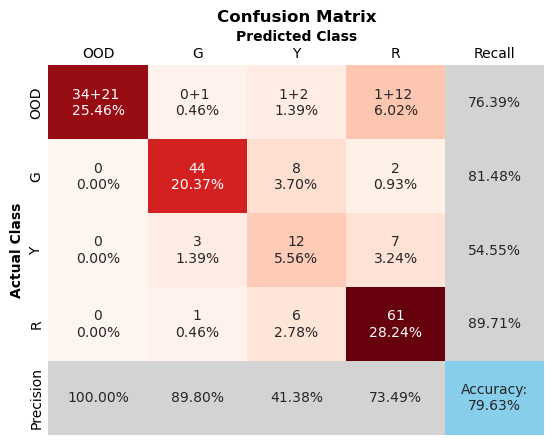

CPU times: total: 4.61 s
Wall time: 817 ms


In [97]:
%%time
set_random_seed(0)
lgbmodel = OODModel(model_type='lightgbm', use_class_weight=False, hierarchical_model=True)
lgbmodel.train(Xnum['train-smote'], ynum['train-smote'], Xnum['ood-train'])

name = "LGB-smote"
models[name] = lgbmodel

# ynum['train-pred'] = lgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = lgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = lgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

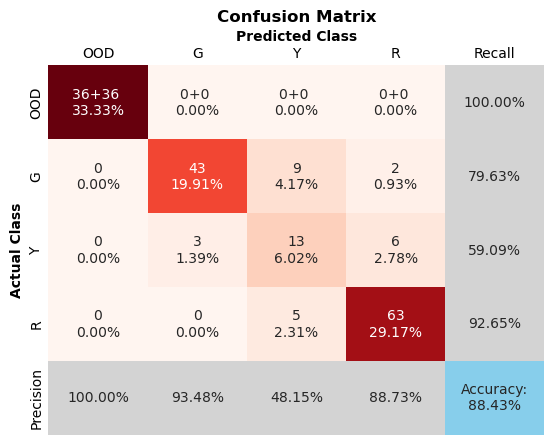

CPU times: total: 3.36 s
Wall time: 652 ms


In [98]:
%%time
set_random_seed(0)
lgbmodel = OODModel(model_type='lightgbm', use_class_weight=True, hierarchical_model=True)
lgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "LGB-weight"
models[name] = lgbmodel

# ynum['train-pred'] = lgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = lgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = lgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

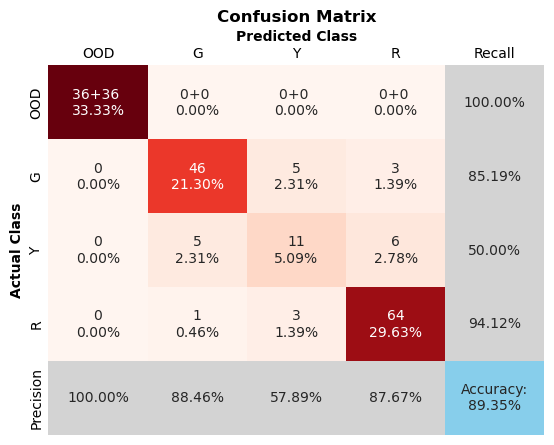

CPU times: total: 3.3 s
Wall time: 643 ms


In [99]:
%%time
set_random_seed(0)
lgbmodel = OODModel(model_type='lightgbm', use_class_weight=False, hierarchical_model=True)
lgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "LGB"
models[name] = lgbmodel

# ynum['train-pred'] = lgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = lgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = lgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

In [100]:
# test.get_metrics()

In [101]:
test_far.get_metrics()

,Macro Precision,Macro Recall,Macro F1-Score,Accuracy
Method,,,,
MLP+OE_odin,0.692560,0.652543,0.656216,0.754630
Paper,0.666220,0.633628,0.634457,0.745370
XGB-smote,0.761195,0.760670,0.748872,0.787037
XGB-weight,0.812104,0.806100,0.807267,0.875000
XGB,0.822619,0.815359,0.818005,0.884259
CB-smote,0.806712,0.807053,0.805664,0.875000
CB-weight,0.806413,0.795145,0.798534,0.870370
CB,0.791303,0.772418,0.777492,0.861111
LGB-smote,0.761673,0.755304,0.749761,0.796296


In [102]:
all_metrics = pd.DataFrame()
columns = ['FPR@95', 'AUROC', 'AUPR_IN', 'AUPR_OUT', 'ID Accuracy']
for model_name in models:
    model = models[model_name]
    if isinstance(model, OODModel):
        metrics = get_ood_score_boost(model, Xnum['test'], ynum['test'], np.concatenate((Xnum['ood-test'], Xnum['ood-far-test']), axis=0))
    else:
        if model_name == 'Paper':
            detector = 'MSP'
        else:
            detector = model_name.split('_')[1]
        
        score_function = detection_method(detector=detector, model=model, k_knn=5, x_train=X['train-smote'], y_train=y['train-smote'], 
                                      batch_size=128, n_classes=num_classes, vim_dim=64, lr=learning_rate)
        metrics = get_ood_score(model=model, in_test_features=X['test'], in_test_labels=y['test'], score_function=score_function, 
                  out_features=torch.cat((X['ood-test'], X['ood-far-test']), axis=0), missclass_as_ood=False)
    
    metrics_df = pd.DataFrame([metrics], index=[model_name], columns=columns)  # Convert the metrics into a 1-row DataFrame
    
    all_metrics = pd.concat([all_metrics, metrics_df])
all_metrics = all_metrics * 100 

In [103]:
all_metrics.style.apply(highlight_ood_metrics, axis=0)

,FPR@95,AUROC,AUPR_IN,AUPR_OUT,ID Accuracy
MLP+OE_odin,0.000000,100.000000,100.000000,100.000000,72.222222
Paper,0.000000,100.000000,100.000000,100.000000,71.527778
XGB-smote,0.000000,99.932485,99.965913,99.873043,80.555556
XGB-weight,0.000000,100.000000,100.000000,100.000000,82.638889
XGB,0.000000,100.000000,100.000000,100.000000,84.027778
CB-smote,0.000000,100.000000,100.000000,100.000000,82.638889
CB-weight,0.000000,100.000000,100.000000,100.000000,83.333333
CB,0.000000,100.000000,100.000000,100.000000,81.944444
LGB-smote,0.000000,99.980710,99.990454,99.961416,81.250000
LGB-weight,0.000000,100.000000,100.000000,100.000000,82.638889


# RC column Spiral

In [ ]:
file_path = r'C:\Users\E2-415\Desktop\Databases\spiral_properties_edited.xlsx'
problem_name = "_SC"
df3 = pd.read_excel(file_path, sheet_name='spiral_properties')
df3.head()

## Data Exploration


In [ ]:
df3['P-D'] = df3['P-D'].astype(str)

In [ ]:
print_ranges(df3)

In [ ]:
print(df3.groupby('Cross Section').size())
print(df3.groupby('Configuration').size())
print(df3.groupby('P-D').size())
print(df3.groupby('Failure Type').size())

In [ ]:
df3_mod= df3[(df3['Cross Section']!='S')]

print(df3_mod.groupby('Cross Section').size())
print(df3_mod.groupby('Failure Type').size())

Exclude P-D, Configuration, fsu, and rudimentary data

In [ ]:
df3_mod = df3_mod[df3_mod.columns.difference(['fsu Long Bars','# Longitudinal Bars', 'Diameter Long Bars', 'Diameter, Spiral', 'Lsplice'])]
df3_mod.head()

### Problem
- fsu has blank/zero property
- there are columns without spiral reinforcement
- P-D -
- HH to little sample

Exclude this

In [ ]:
df3_mod[df3_mod['Hoop Spacing, sv']==0]

In [ ]:
df3_mod[df3_mod['Cover to Ctr of Hoop Bar']==0]

In [ ]:
df3_mod[df3_mod['fy, Spiral']==0]

In [ ]:
df3_mod = df3_mod.loc[df3_mod['fy, Spiral'] != 0]

In [ ]:
df3_mod[df3_mod['P-D']=='-']

In [ ]:
df3_mod = df3_mod.loc[df3_mod['P-D']!='-']

In [ ]:
df3_mod = df3_mod.loc[df3_mod['Configuration']!='HH']

In [ ]:
print_ranges(df3_mod)

In [ ]:
print(df3_mod.groupby('Cross Section').size())
print(df3_mod.groupby('Configuration').size())
print(df3_mod.groupby('P-D').size())
print(df3_mod.groupby('Failure Type').size())

### Data Normalization

In [ ]:
X=df3_mod[df3_mod.columns.difference(['Failure Type'])]
y=df3_mod['Failure Type']

In [ ]:
processed_df, len_numerical, len_ohes, additional_info = process_dataframe(X.copy(), scaler = 'standard')

print("Processed DataFrame:")
print(processed_df)

print("\nLength of Numerical Columns:")
print(len_numerical)

print("\nLength of Categorical Columns:")
print(len_ohes)

## Comparison of Data Generation

### VAE

In [ ]:
x_train = tensor(processed_df.values, dtype=torch.float32)

layers_dim = [128, 64, 32, 3]  # Encoder and Decoder layer sizes
batch_size = 32
epochs = 500
iter_vae = epochs # if = epoch return to vae
learning_rate = 5e-3
num_var = len_numerical + sum(len_ohes)

vae = VAE(len_numerical, len_ohes, layers_dim=layers_dim, batch_norm=True, activation='relu', dropout_rate=0.0)

vae.train_model(x_train, lr_e=learning_rate, lr_d=learning_rate, batch_size=batch_size, n_iter=epochs, iter_vae=iter_vae, 
                    beta_kl=0.5, beta_rec=1.0)

In [ ]:
vae.eval()
with torch.no_grad():
    mu, _, _, recon_data = vae(x_train)

In [ ]:
mse_loss(recon_data, x_train)

In [ ]:
plot_embed(mu,y)

#### Sample Generation

In [ ]:
z_sample = torch.randn(size=(x_train.shape[0], layers_dim[-1]))
synth_data = vae.sample(z_sample)

In [ ]:
recon_df = reverse_process_dataframe(synth_data, len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols'].difference(['P'])
recon_df[cols] = recon_df[cols].clip(lower=0)

In [ ]:
distribution_comparison(X, recon_df, stacked=True)

In [ ]:
corrmap_comparison(X, recon_df)

#### OOD Generation

In [ ]:
latent_var = mu.numpy()

# hard brownian offset guarantee samples at leat d_min distance away from rest of sample
ood = soft_brownian_offset(latent_var, d_min=2, d_off=0.5, softness=0, n_samples = len(x_train))

x_ood = np.concatenate((latent_var,ood), axis = 0)
y_ood = ['ID']*len(y) +['OOD'] *len(x_train)
plot_embed(x_ood,y_ood)

In [ ]:
synth_data = vae.sample(tensor(ood, dtype=torch.float32))

recon_df = reverse_process_dataframe(synth_data, len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols'].difference(['P'])
recon_df[cols] = recon_df[cols].clip(lower=0)

In [ ]:
distribution_comparison(X, recon_df, stacked=False)

### PCA

In [ ]:
n_latent = layers_dim[-1]
pca = PCA(n_components=n_latent)
latent_var = pca.fit_transform(processed_df.values)
rec_X = pca.inverse_transform(latent_var)

In [ ]:
plot_embed(latent_var, y)

In [ ]:
mse_loss(tensor(rec_X), x_train)

In [ ]:
lv_sample=generate_nd_ball_sample(processed_df.shape[0], n_latent, max(l2dist(rec_X))[0])
synth_data = pca.inverse_transform(lv_sample)

In [ ]:
recon_df = reverse_process_dataframe(tensor(synth_data), len_numerical, len_ohes, additional_info)
cols = additional_info['numerical_cols'].difference(['P'])
recon_df[cols] = recon_df[cols].clip(lower=0)

In [ ]:
distribution_comparison(X, recon_df, stacked=True)

In [ ]:
corrmap_comparison(X, recon_df)

## OOD and ID Prediction

In [ ]:
features=processed_df.values
label=df3_mod['Failure Type'] - 1 # starts from 0

In [ ]:
# split data into train and test
num_classes = len(label.unique())
id_feature = np.array(features)
id_label = np.array(label) 

X, y = {}, {}
X['train'], X['test'], y['train'], y['test'] = train_test_split(id_feature, id_label, test_size=0.3, random_state=0)

# Apply SMOTE to handle imbalance dataset
smote = SMOTE(random_state=42)
X['train-smote'], y['train-smote'] = smote.fit_resample(X['train'], y['train'])

In [ ]:
# transform numpy arrays into tensor arrays
X = numpy_to_tensor(X, dtype=torch.float32)
y = numpy_to_tensor(y, dtype=torch.int64)

In [ ]:
%%time
# Train VAE model to generate latent space
set_random_seed(0)

layers_dim = [128, 64, 32, 3]  # Encoder and Decoder layer sizes
batch_size = 64
epochs = 500
iter_vae = epochs # if = epoch return to vae
learning_rate = 2e-4
num_var = len_numerical + sum(len_ohes)

vae = VAE(len_numerical, len_ohes, layers_dim=layers_dim, batch_norm=True, activation='relu', dropout_rate=0.0)

vae.train_model(X['train'], lr_e=learning_rate, lr_d=learning_rate, batch_size=batch_size, n_iter=epochs, iter_vae=iter_vae, 
                    beta_kl=0.5, beta_rec=1.0)

vae.eval()
with torch.no_grad():
    mu, _, _, recon_data = vae(X['train'])

In [ ]:
# generate ood sample and transform back into original distribution
min_dist = 1.5
offset = 0.5
softness = 1

max_rad = max(l2dist(mu))
far_rad_in = max_rad + 2.5
far_rad_out = far_rad_in + 10

# hard brownian offset guarantee samples at least d_min distance away from rest of sample
ood_lv_train = soft_brownian_offset(mu.numpy(), d_min=min_dist, d_off=offset, softness=softness, n_samples = len(X['train']))
X['ood-train'] = vae.sample(tensor(ood_lv_train, dtype=torch.float32)).detach()

ood_lv = soft_brownian_offset(mu.numpy(), d_min=min_dist, d_off=offset, softness=softness, n_samples = len(X['test'])//4)
X['ood-test'] = vae.sample(tensor(ood_lv, dtype=torch.float32)).detach()

lv_far = generate_nd_gaussian(far_rad_in, far_rad_out, d=3, num_samples=len(X['test'])//4)
X['ood-far-test'] = vae.sample(tensor(lv_far, dtype=torch.float32)).detach()

In [ ]:
Xnum = tensor_to_numpy(X)
ynum = tensor_to_numpy(y)

In [ ]:
X['train-cat'] = torch.cat((X['train-smote'], X['ood-train']), dim=0)
y['train-cat'] = torch.cat((y['train-smote'] + 1, torch.zeros(len(X['ood-train']), dtype=torch.long)), dim=0)
X['test-cat'] = torch.cat((X['test'], X['ood-test']), dim=0)
y['test-cat'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']), dtype=torch.long)), dim=0)
X['test-far-cat'] = torch.cat((X['test'], X['ood-test'], X['ood-far-test']), axis=0)
y['test-far-cat'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']) + len(X['ood-far-test']), dtype=torch.long)), dim=0)
y['mask'] = torch.cat((y['test'] + 1, torch.zeros(len(X['ood-test']), dtype=torch.long) ,-torch.ones(len(X['ood-far-test']), dtype=torch.long)), dim=0)

Xnum['train-cat'] = np.concatenate((Xnum['train-smote'], Xnum['ood-train']), axis=0)
ynum['train-cat'] = np.concatenate((ynum['train-smote'] + 1, np.zeros(len(Xnum['ood-train']), dtype=np.int64)), axis=0)
Xnum['test-cat'] = np.concatenate((Xnum['test'], Xnum['ood-test']), axis=0)
ynum['test-cat'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']), dtype=np.int64)), axis=0)
Xnum['test-far-cat'] = np.concatenate((Xnum['test'], Xnum['ood-test'], Xnum['ood-far-test']), axis=0)
ynum['test-far-cat'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']) +len(Xnum['ood-far-test']), dtype=np.int64)), axis=0)
ynum['mask'] = np.concatenate((ynum['test'] + 1, np.zeros(len(Xnum['ood-test']), dtype=np.int64) ,-np.ones(len(Xnum['ood-far-test']), dtype=np.int64)), axis=0)

Xnum['train-cat'] = np.concatenate((Xnum['train'], Xnum['ood-train']), axis=0)
ynum['train-cat'] = np.concatenate((ynum['train'] + 1, np.zeros(len(Xnum['ood-train']), dtype=np.int64)), axis=0)

In [ ]:
test = ClassificationComparison(y['test-cat'])
test_far = ClassificationComparison(y['test-far-cat'])

models = {}

### MLP

In [ ]:
%%time
set_random_seed(0)
module = MLP(X['train'].shape[1], [256, 512, 512, 512, 256], 'relu', 0.0, num_classes)

module.train_model_oe(X['train-smote'], y['train-smote'], X['ood-train'], num_epochs=500)

In [ ]:
detectors = ['MSP', 'KNN', 'OpenMax', 'MDS', 'RMDS', 'odin', 'gram', 'ebo',
             'gradnorm',  'mls', 'vim', 'dice', 'ash', 'she_inner']
all_metrics = pd.DataFrame()
columns = ['FPR@95', 'AUROC', 'AUPR_IN', 'AUPR_OUT', 'Accuracy']
detector_params = dict(k_knn=5, x_train=X['train-smote'], y_train=y['train-smote'],
                       batch_size=128, n_classes=num_classes, vim_dim=64, lr=learning_rate)

for detector in detectors:
    score_function = detection_method(detector=detector, model=module, **detector_params)
    metrics = get_ood_score(model=module, in_test_features=X['test'], in_test_labels=y['test'], score_function=score_function, 
                  out_features=torch.cat((X['ood-test'], X['ood-far-test'])), missclass_as_ood=False)
    
    # Convert the metrics to a DataFrame and add the detector name as the index
    metrics_df = pd.DataFrame([metrics], index=[detector], columns=columns)  # Convert the metrics into a 1-row DataFrame
    
    # Concatenate the new metrics with the existing all_metrics DataFrame
    all_metrics = pd.concat([all_metrics, metrics_df])
all_metrics = all_metrics * 100 

In [ ]:
all_metrics.style.apply(highlight_ood_metrics, axis=0)

In [ ]:
name = "MLP+OE_dice"
models[name] = module

# y['train-pred'] = module.predict_with_ood(X['train-cat'], detector="odin", threshold_method = 'roc')
# out = extended_confusion_matrix(y['train-cat'], y['train-pred'])

# y['test-pred'] = module.predict_with_ood(X['test-cat'], detector="dice", threshold_method='roc', **detector_params)
# out = extended_confusion_matrix(y['test-cat'], y['test-pred'])
# test.calculate_metrics(y['test-pred'], name)

y['test-pred'] = module.predict_with_ood(X['test-far-cat'], detector="dice", threshold_method='roc', **detector_params)
out = extended_confusion_matrix(y['test-far-cat'], y['test-pred'], y_mask=y['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(y['test-pred'], name)

### Paper

In [ ]:
%%time
set_random_seed(0)
module = MLP(X['train'].shape[1], [1000, 500, 250, 500, 1000], 'relu', 0.0, num_classes)

module.train_model_oe(X['train-smote'], y['train-smote'], X['ood-train'], num_epochs=500)

In [ ]:
%%time
name = "Paper"
models[name] = module

# y['train-pred'] = module.predict_with_ood(X['train-cat'], detector="MSP", threshold_method = 'percentile')
# out = extended_confusion_matrix(y['train-cat'], y['train-pred'])

# y['test-pred'] = module.predict_with_ood(X['test-cat'], detector="MSP", threshold_method = 'percentile')
# out = extended_confusion_matrix(y['test-cat'], y['test-pred'])
# test.calculate_metrics(y['test-pred'], name)

y['test-pred'] = module.predict_with_ood(X['test-far-cat'], detector="MSP", threshold_method = 'percentile')
out = extended_confusion_matrix(y['test-far-cat'], y['test-pred'], y_mask=y['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(y['test-pred'], name)

### XGBoost

In [ ]:
%%time
set_random_seed(0)
xgbmodel = OODModel(model_type='xgboost', use_class_weight=False, hierarchical_model=True)
xgbmodel.train(Xnum['train-smote'], ynum['train-smote'], Xnum['ood-train'])

name = "XGB-smote"
models[name] = xgbmodel

# ynum['train-pred'] = xgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = xgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = xgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

In [ ]:
%%time
set_random_seed(0)
xgbmodel = OODModel(model_type='xgboost', use_class_weight=True, hierarchical_model=True)
xgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "XGB-weight"
models[name] = xgbmodel

# ynum['train-pred'] = xgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = xgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = xgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

In [ ]:
%%time
set_random_seed(0)
xgbmodel = OODModel(model_type='xgboost', use_class_weight=False, hierarchical_model=True)
xgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "XGB"
models[name] = xgbmodel

# ynum['train-pred'] = xgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = xgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = xgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

### CatBoost

In [ ]:
%%time
set_random_seed(0)
catmodel = OODModel(model_type='catboost', use_class_weight=False, hierarchical_model=True)
catmodel.train(Xnum['train-smote'], ynum['train-smote'], Xnum['ood-train'], verbose=False)

name = "CB-smote"
models[name] = catmodel

# ynum['train-pred'] = catmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = catmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = catmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

In [ ]:
%%time
set_random_seed(0)
catmodel = OODModel(model_type='catboost', use_class_weight=True, hierarchical_model=True)
catmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'], verbose=False)

name = "CB-weight"
models[name] = catmodel

# ynum['train-pred'] = catmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = catmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = catmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

In [ ]:
%%time
set_random_seed(0)
catmodel = OODModel(model_type='catboost', use_class_weight=False, hierarchical_model=True)
catmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'], verbose=False)

name = "CB"
models[name] = catmodel

# ynum['train-pred'] = catmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = catmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = catmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

### LightGBM

In [ ]:
%%time
set_random_seed(0)
lgbmodel = OODModel(model_type='lightgbm', use_class_weight=False, hierarchical_model=True)
lgbmodel.train(Xnum['train-smote'], ynum['train-smote'], Xnum['ood-train'])

name = "LGB-smote"
models[name] = lgbmodel

# ynum['train-pred'] = lgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = lgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = lgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

In [ ]:
%%time
set_random_seed(0)
lgbmodel = OODModel(model_type='lightgbm', use_class_weight=True, hierarchical_model=True)
lgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "LGB-weight"
models[name] = lgbmodel

# ynum['train-pred'] = lgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = lgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = lgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

In [ ]:
%%time
set_random_seed(0)
lgbmodel = OODModel(model_type='lightgbm', use_class_weight=False, hierarchical_model=True)
lgbmodel.train(Xnum['train'], ynum['train'], Xnum['ood-train'])

name = "LGB"
models[name] = lgbmodel

# ynum['train-pred'] = lgbmodel.predict(Xnum['train-cat'])
# out = extended_confusion_matrix(ynum['train-cat'], ynum['train-pred'])

# ynum['test-pred'] = lgbmodel.predict(Xnum['test-cat'])
# out = extended_confusion_matrix(ynum['test-cat'], ynum['test-pred'])
# test.calculate_metrics(ynum['test-pred'], name)

ynum['test-pred'] = lgbmodel.predict(Xnum['test-far-cat'])
out = extended_confusion_matrix(ynum['test-far-cat'], ynum['test-pred'], y_mask=ynum['mask'], class_names=class_names, prefix=name+problem_name)
test_far.calculate_metrics(ynum['test-pred'], name)

In [ ]:
# test.get_metrics()

In [ ]:
test_far.get_metrics()

In [ ]:
all_metrics = pd.DataFrame()
columns = ['FPR@95', 'AUROC', 'AUPR_IN', 'AUPR_OUT', 'ID Accuracy']
for model_name in models:
    model = models[model_name]
    if isinstance(model, OODModel):
        metrics = get_ood_score_boost(model, Xnum['test'], ynum['test'], np.concatenate((Xnum['ood-test'], Xnum['ood-far-test']), axis=0))
    else:
        if model_name == 'Paper':
            detector = 'MSP'
        else:
            detector = model_name.split('_')[1]
        
        score_function = detection_method(detector=detector, model=model, k_knn=5, x_train=X['train-smote'], y_train=y['train-smote'], 
                                      batch_size=128, n_classes=num_classes, vim_dim=64, lr=learning_rate)
        metrics = get_ood_score(model=model, in_test_features=X['test'], in_test_labels=y['test'], score_function=score_function, 
                  out_features=torch.cat((X['ood-test'], X['ood-far-test']), axis=0), missclass_as_ood=False)
    
    metrics_df = pd.DataFrame([metrics], index=[model_name], columns=columns)  # Convert the metrics into a 1-row DataFrame
    
    all_metrics = pd.concat([all_metrics, metrics_df])
all_metrics = all_metrics * 100 

In [ ]:
all_metrics.style.apply(highlight_ood_metrics, axis=0)

# Artifact